# Summarize models fit to natural populations

This notebook summarizes all metrics required for model comparison including the following:

  1. Standardized predictor distributions
  1. Model residuals by predictor
  1. Forecast errors overall and by timepoint
  1. Model coefficients averages and by timepoint
  
## Table of contents

 1. [Import and define functions](#Import-and-define-functions)
 1. [Define configuration settings](#Define-configuration-settings)
 1. [Load data](#Load-data)
 1. [Summarize predictors](#Summarize-predictors)
 1. [Summarize model residuals](#Summarize-model-residuals)
 1. [Summarize observed and predicted distances](#Summarize-observed-and-predicted-distances)
 1. [Summarize model forecasting error](#Summarize-model-forecasting-error)

## Import and define functions
[back to top](#Summarize-models)

In [1]:
import Bio.SeqIO
from collections import defaultdict
import glob
import json
import matplotlib as mpl
import matplotlib.dates as mdates
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import networkx as nx
import numpy as np
import pandas as pd
from scipy.stats import pearsonr
from scipy.stats import linregress
import seaborn as sns

%matplotlib inline

In [2]:
sns.set_style("white")
plt.style.use("huddlej")

In [3]:
mpl.rcParams['savefig.dpi'] = 200
mpl.rcParams['figure.dpi'] = 200
mpl.rcParams['font.weight'] = 300
mpl.rcParams['axes.labelweight'] = 300
mpl.rcParams['font.size'] = 18

In [4]:
!pwd

/Users/jlhudd/projects/nextstrain/flu-forecasting/analyses


In [5]:
def mean_absolute_error(observed, estimated, **kwargs):
    """
    Calculates the mean absolute error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean absolute error between observed and estimated values
    """
    return np.mean(np.abs(observed - estimated))

def root_mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the root mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        root mean square error between observed and estimated values
    """
    return np.sqrt(np.mean((observed - estimated) ** 2))

def mean_square_error(observed, estimated, **kwargs):
    """
    Calculates the mean square error between observed and estimated values.

    Parameters
    ----------
    observed : numpy.ndarray
        observed values

    estimated : numpy.ndarray
        estimated values

    Returns
    -------
    float :
        mean square error between observed and estimated values
    """
    return np.mean((observed - estimated) ** 2)

def facet_time_plot(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue, height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate()
    return g

## Define configuration settings
[back to top](#Summarize-models)

In [6]:
predictor_names_order = [
    "naive",
    "ep",
    "ep_star",
    "ep_x",
    "cTiterSub",
    "cTiterSub_star",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "delta_frequency",
    "lbi",
    "lbi-ne_star",
    "lbi-cTiterSub_x-dms_star",
    "lbi-ep_x-ne_star"
]

In [7]:
"""predictor_names_order = [
    "naive",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

predictor_names_order = [
    "naive",
    "ep_x",
    "cTiter",
    "cTiterSub",
    "cTiterSub_star",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency",
    "ep_x-ne_star",
    "lbi-ne_star",
    "lbi-ep_x-ne_star"
]

#predictor_names_order = [
#    "naive",
#    "lbi"
#]"""

'predictor_names_order = [\n    "naive",\n    "ep_x",\n    "cTiterSub_x",\n    "ne_star",\n    "dms_star",\n    "lbi",\n    "delta_frequency"\n]\n\npredictor_names_order = [\n    "naive",\n    "ep_x",\n    "cTiter",\n    "cTiterSub",\n    "cTiterSub_star",\n    "cTiterSub_x",\n    "ne_star",\n    "dms_star",\n    "lbi",\n    "delta_frequency",\n    "ep_x-ne_star",\n    "lbi-ne_star",\n    "lbi-ep_x-ne_star"\n]\n\n#predictor_names_order = [\n#    "naive",\n#    "lbi"\n#]'

In [8]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [9]:
data_root = "../results/builds/h3n2/90_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/1_viruses_per_month/sample_0/2000-10-01--2015-10-01/"
data_root = "../results/builds/h3n2/5_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

data_root = "../results/builds/h3n2/10_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

#data_root = "../results/builds/h3n2/30_viruses_per_month/sample_0/1994-10-01--2015-10-01/"

## Load data
[back to top](#Summarize-models)

In [10]:
tip_attributes_df = pd.read_table(data_root + "tip_attributes_with_weighted_distances.tsv", parse_dates=["timepoint"])

In [11]:
observed_weighted_distances = tip_attributes_df.loc[:, ["timepoint", "strain", "frequency", "weighted_distance_to_future"]].copy()

In [12]:
observed_weighted_distances["y"] = observed_weighted_distances["weighted_distance_to_future"]

In [13]:
model_jsons = glob.glob(data_root + "models_by_distances/*.json")

In [14]:
models_by_predictors = {}

for model_json in model_jsons:
    with open(model_json, "r") as fh:
        data = json.load(fh)
        models_by_predictors["-".join(data["predictors"])] = data

In [15]:
models_by_predictors["lbi"]["cost_function"]

'diffsum'

In [16]:
models_by_predictors["lbi"]["l1_lambda"]

0.01

In [17]:
models_by_predictors["lbi"]["training_window"]

6

In [18]:
models_by_predictors["lbi"]["pseudocount"]

In [19]:
type(models_by_predictors["lbi"])

dict

In [20]:
sorted(models_by_predictors.keys())

['cTiter',
 'cTiterSub',
 'cTiterSub_star',
 'cTiterSub_x',
 'delta_frequency',
 'dms_star',
 'ep',
 'ep_star',
 'ep_x',
 'lbi',
 'lbi-cTiterSub_x-dms_star',
 'lbi-ep_x-ne_star',
 'lbi-ne_star',
 'naive',
 'ne_star']

In [21]:
models_by_predictors["lbi"].keys()

dict_keys(['scores', 'predictors', 'cv_error_mean', 'cv_error_std', 'coefficients_mean', 'coefficients_std', 'mean_stds_mean', 'mean_stds_std', 'cost_function', 'l1_lambda', 'delta_months', 'training_window', 'pseudocount'])

In [22]:
models_by_predictors["lbi"]["scores"][0].keys()

dict_keys(['predictors', 'training_data', 'training_n', 'training_error', 'coefficients', 'mean_stds', 'validation_data', 'validation_n', 'validation_error', 'last_training_timepoint', 'validation_timepoint'])

In [23]:
models_by_predictors["lbi"]["scores"][0]["training_n"]

448

In [24]:
models_by_predictors["lbi"]["scores"][0]["validation_data"].keys()

dict_keys(['y', 'y_hat'])

In [25]:
models_by_predictors["lbi"]["scores"][0]["coefficients"]

[1.250504682281319]

In [26]:
models_by_predictors["lbi"]["scores"][0]["mean_stds"]

[0.11347984991711071]

In [27]:
len(models_by_predictors["lbi"]["scores"])

25

Build data frames for plotting from the model scores.

In [28]:
overall_errors = []
errors_by_time = []
overall_coefficients = []
coefficients_by_time = []
mean_stds_by_time = []
frequency_dfs = []
residuals_dfs = []

for predictors, model in models_by_predictors.items():
    overall_errors.append({
        "predictors": predictors,
        "cv_error_mean": model["cv_error_mean"],
        "cv_error_std": model["cv_error_std"]
    })

    for predictor, mean, std in zip(model["predictors"], model["coefficients_mean"], model["coefficients_std"]):
        overall_coefficients.append({
            "predictors": predictors,
            "predictor": predictor,
            "mean": mean,
            "std": std
        })
    
    for scores in model["scores"]:
        errors_by_time.append({
            "predictors": predictors,
            "validation_timepoint": pd.to_datetime(scores["validation_timepoint"]),
            "validation_error": scores["validation_error"],
            "validation_n": scores["validation_n"]
        })
        
        for predictor, coefficient, mean_std in zip(model["predictors"], scores["coefficients"], scores["mean_stds"]):
            coefficients_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "coefficient": coefficient,
                "validation_timepoint": pd.to_datetime(scores["validation_timepoint"])
            })
            
            mean_stds_by_time.append({
                "predictors": predictors,
                "predictor": predictor,
                "mean_std": mean_std,
                "validation_timepoint": scores["validation_timepoint"]
            })
        
        #X = pd.DataFrame(scores["validation_data"]["X"])
        #X["timepoint"] = pd.to_datetime(X["timepoint"])

        y = pd.DataFrame(scores["validation_data"]["y"])
        y["timepoint"] = pd.to_datetime(y["timepoint"])
        y["future_timepoint"] = pd.to_datetime(y["future_timepoint"])

        y_hat = pd.DataFrame(scores["validation_data"]["y_hat"])
        y_hat["timepoint"] = pd.to_datetime(y_hat["timepoint"])

        frequency_df = y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        frequency_df["residual"] = frequency_df["y"] - frequency_df["y_hat"]
        frequency_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        frequency_df["predictors"] = predictors
        frequency_dfs.append(frequency_df)

        #training_X = pd.DataFrame(scores["training_data"]["X"])
        #training_X["timepoint"] = pd.to_datetime(training_X["timepoint"])

        training_y = pd.DataFrame(scores["training_data"]["y"])
        training_y["timepoint"] = pd.to_datetime(training_y["timepoint"])
        training_y_hat = pd.DataFrame(scores["training_data"]["y_hat"])
        training_y_hat["timepoint"] = pd.to_datetime(training_y_hat["timepoint"])
        residual_df = training_y_hat.merge(
            observed_weighted_distances,
            on=["timepoint", "strain", "frequency"],
            suffixes=["_hat", ""]
        )
        residual_df["residual"] = residual_df["y"] - residual_df["y_hat"]
        residual_df["validation_timepoint"] = pd.to_datetime(scores["validation_timepoint"])
        residual_df["predictors"] = predictors

        residuals_dfs.append(residual_df)
        
overall_errors_df = pd.DataFrame(overall_errors)
errors_by_time_df = pd.DataFrame(errors_by_time)
overall_coefficients_df = pd.DataFrame(overall_coefficients)
coefficients_by_time_df = pd.DataFrame(coefficients_by_time)
mean_stds_by_time_df = pd.DataFrame(mean_stds_by_time)
frequency_df = pd.concat(frequency_dfs, ignore_index=True)
residual_df = pd.concat(residuals_dfs, ignore_index=True)

In [29]:
frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,0.844549,0.000937,0.000873,A/Akita/69/2002,2002-10-01,17.593260,8.578387,12.124272,17.593260,17.593260,5.468988,2002-10-01,dms_star
1,0.274197,0.015340,0.008081,A/Argentina/1/2002,2002-10-01,18.535951,12.900892,14.279906,18.535951,18.535951,4.256045,2002-10-01,dms_star
2,0.538061,0.016621,0.011400,A/Auckland/26/2002,2002-10-01,18.606443,9.420419,13.016532,18.606443,18.606443,5.589911,2002-10-01,dms_star
3,0.172711,0.012752,0.006069,A/Auckland/611/2002,2002-10-01,18.637487,9.550487,13.049181,18.637487,18.637487,5.588306,2002-10-01,dms_star
4,-0.547840,0.000092,0.000021,A/Auckland/614/2002,2002-10-01,19.548135,10.420580,13.949206,19.548135,19.548135,5.598929,2002-10-01,dms_star


In [30]:
residual_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
0,1.019458,0.010155,0.028209,A/England/178/1995,1995-10-01,18.980387,9.209726,6.344777,18.980387,18.980387,12.635610,2002-10-01,dms_star
1,-0.295802,0.044420,0.033118,A/England/258/1995,1995-10-01,19.958412,12.134971,9.163624,19.958412,19.958412,10.794788,2002-10-01,dms_star
2,-0.184167,0.052949,0.044140,A/England/263/1995,1995-10-01,19.980385,9.935627,7.201780,19.980385,19.980385,12.778605,2002-10-01,dms_star
3,0.546533,0.069894,0.120991,A/England/268/1995,1995-10-01,19.980385,9.593383,6.817100,19.980385,19.980385,13.163285,2002-10-01,dms_star
4,-1.103632,0.081289,0.027020,A/England/282/1995,1995-10-01,21.668841,11.610465,9.093700,21.668841,21.668841,12.575141,2002-10-01,dms_star


In [31]:
residual_df.shape

(673905, 13)

In [32]:
overall_errors_df.sort_values("cv_error_mean")

,cv_error_mean,cv_error_std,predictors
13,-0.063501,0.192359,lbi-ne_star
2,-0.059088,0.198657,lbi
3,-0.046738,0.200297,lbi-ep_x-ne_star
5,-0.003969,0.122102,delta_frequency
12,0.026730,0.380462,lbi-cTiterSub_x-dms_star
7,0.097729,0.219163,cTiter
4,0.102578,0.158561,ne_star
0,0.177719,0.163065,dms_star
9,0.202449,0.157568,cTiterSub_star
1,0.203242,0.172668,ep


## Summarize predictors
[back to top](#Summarize-models)

In [33]:
individual_predictor_names_order = [
    predictor
    for predictor in predictor_names_order
    if not "-" in predictor and predictor != "naive"
]

In [34]:
individual_predictor_names_order

['ep',
 'ep_star',
 'ep_x',
 'cTiterSub',
 'cTiterSub_star',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'delta_frequency',
 'lbi']

In [35]:
long_predictors_df = tip_attributes_df.melt(
    id_vars=["strain", "timepoint"],
    value_vars=individual_predictor_names_order,
    var_name="predictor",
    value_name="predictor_value"
)

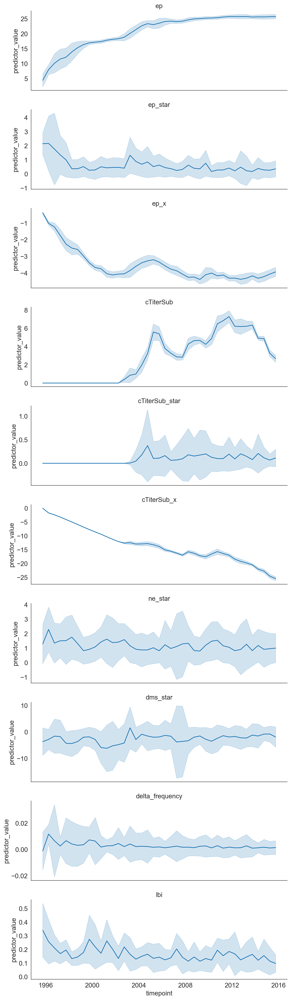

In [36]:
g = sns.FacetGrid(long_predictors_df, row="predictor", aspect=3, sharey=False,
                  row_order=individual_predictor_names_order)
g.map(sns.lineplot, "timepoint", "predictor_value", ci="sd")
g.set_titles("{row_name}")

plt.savefig("../manuscript/figures/predictors_by_timepoint.pdf")

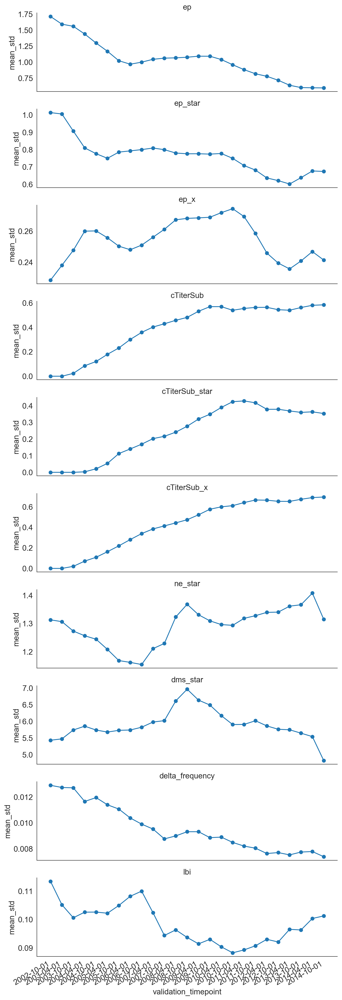

In [37]:
g = sns.FacetGrid(
    mean_stds_by_time_df[mean_stds_by_time_df["predictors"].isin(individual_predictor_names_order)],
    row="predictor",
    row_order=individual_predictor_names_order,
    aspect=3,
    sharey=False
)
g.map(plt.plot, "validation_timepoint", "mean_std", marker="o")
g.set_titles("{row_name}")

plt.gcf().autofmt_xdate()

In [38]:
"""variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]
sns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})"""

'variables_to_plot = [predictor for predictor in predictor_names_order if not "-" in predictor] + ["frequency"]\nsns.pairplot(tip_attributes_df.dropna(), vars=variables_to_plot, diag_kind="hist", diag_kws={"bins": 20})'

In [39]:
tip_attributes_df.loc[pd.isnull(tip_attributes_df["ep_x"]), ["strain", "timepoint", "frequency"]]

,strain,timepoint,frequency


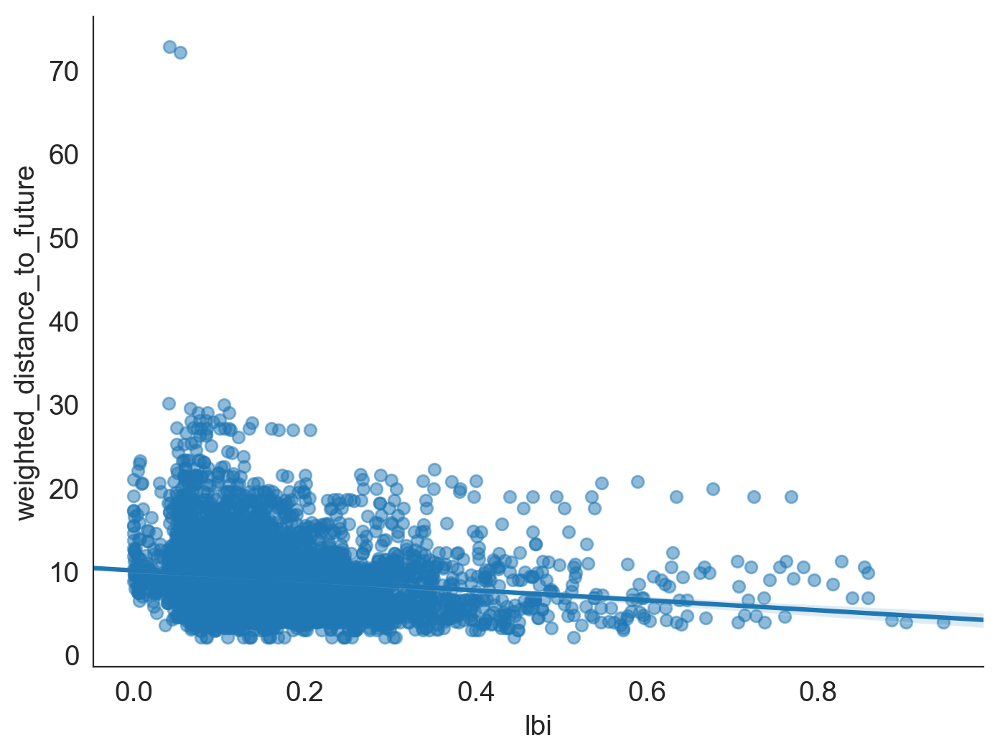

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("lbi", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

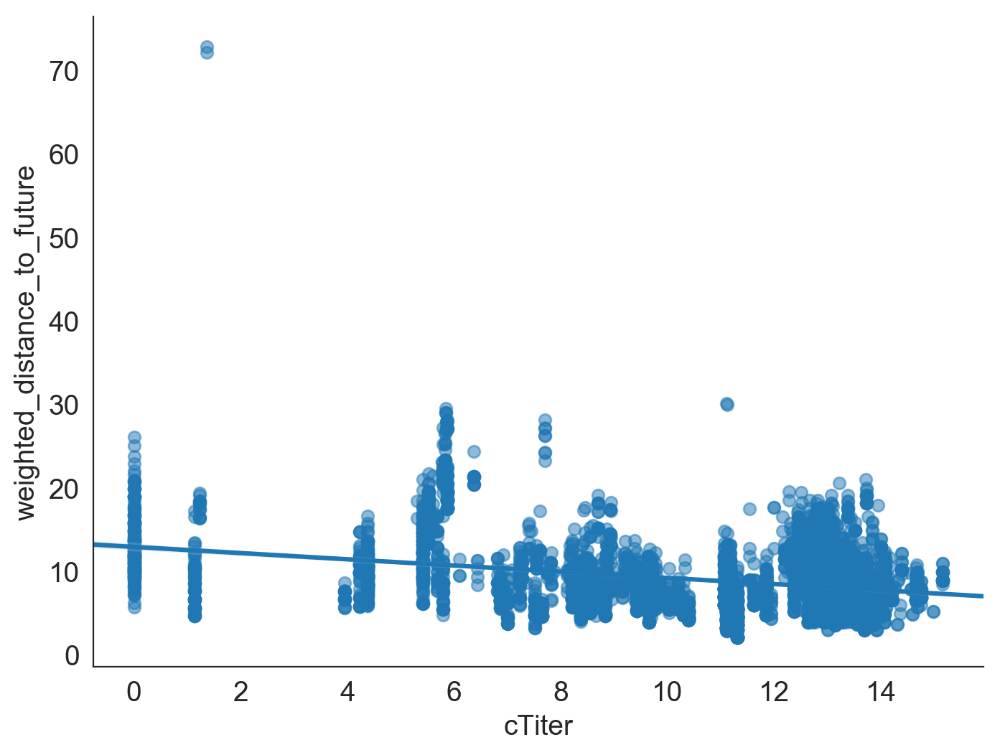

In [41]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

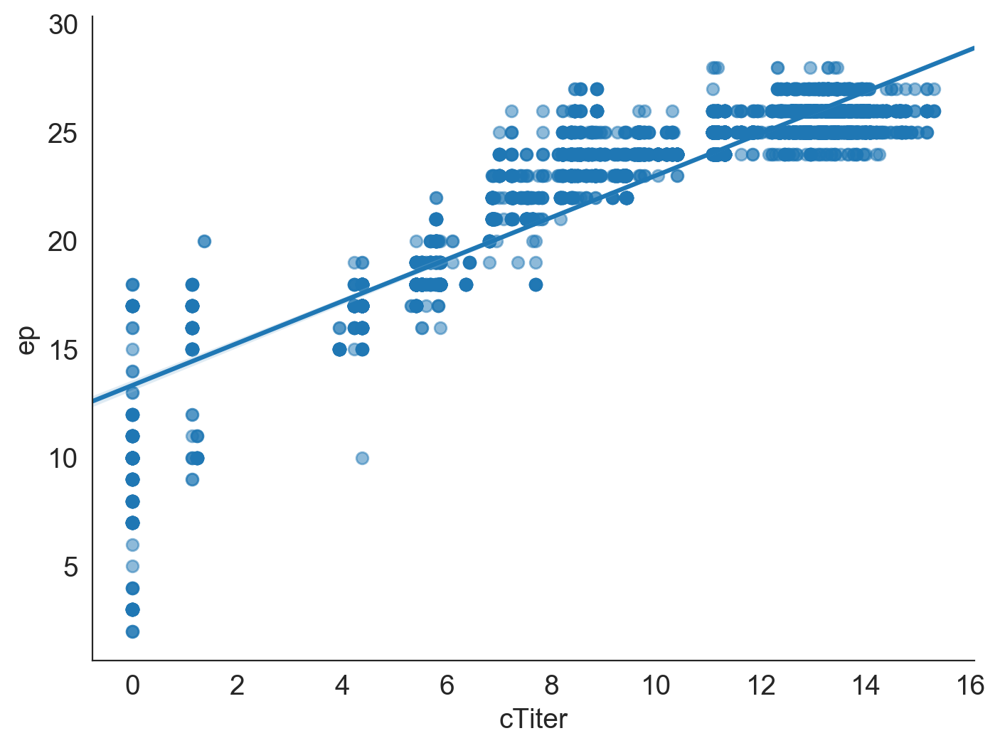

In [42]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "ep", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

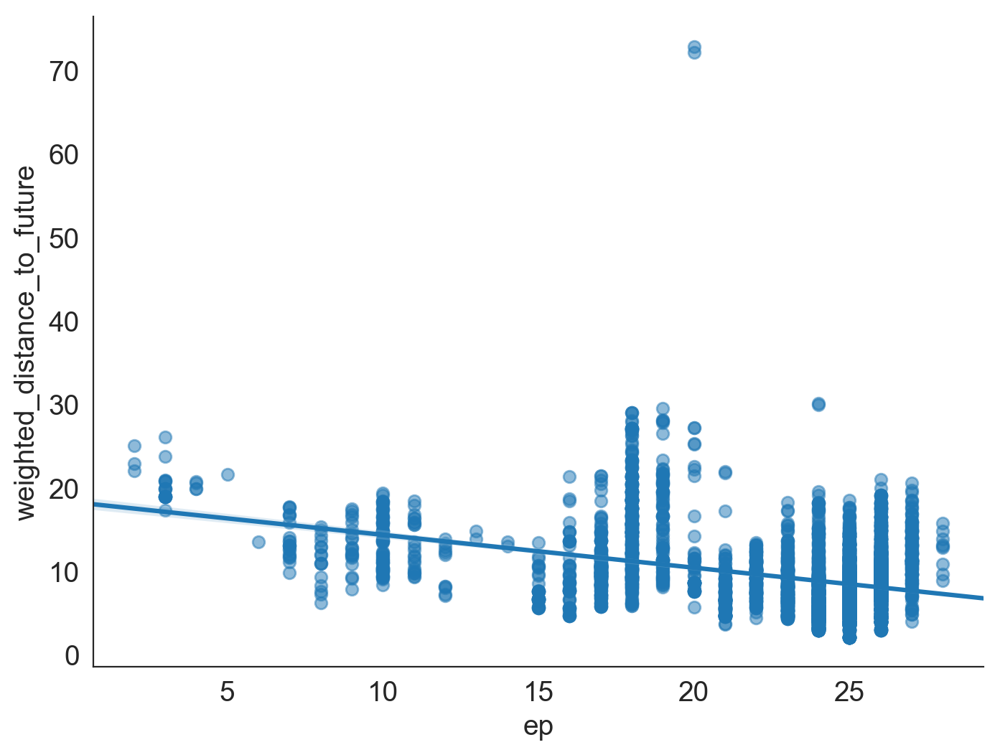

In [43]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("ep", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

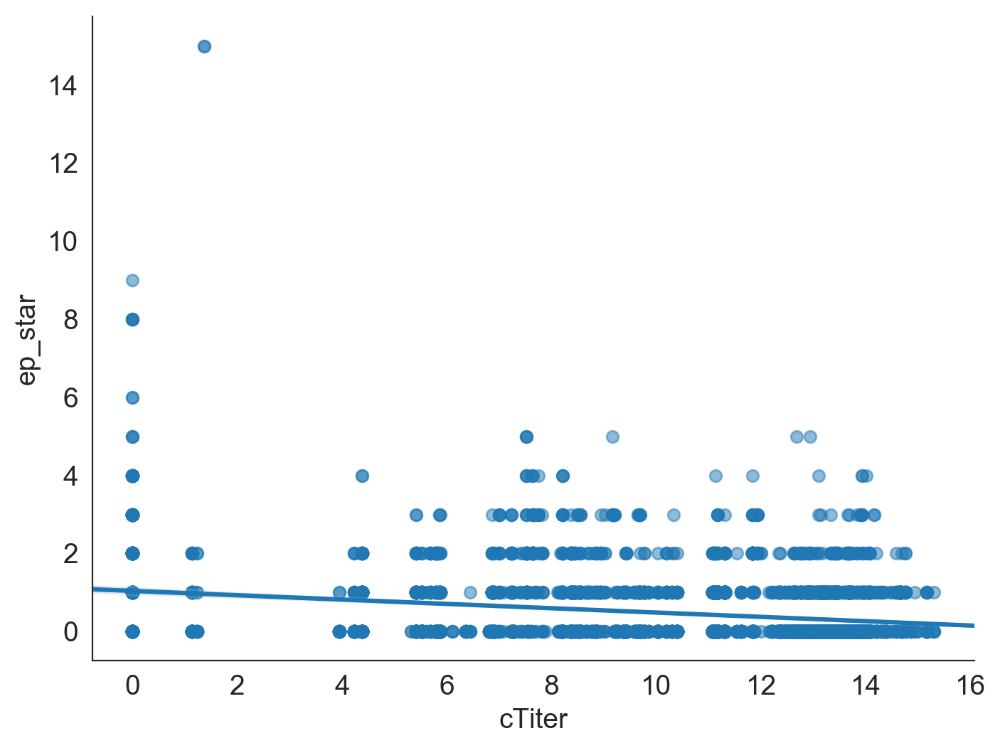

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "ep_star", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

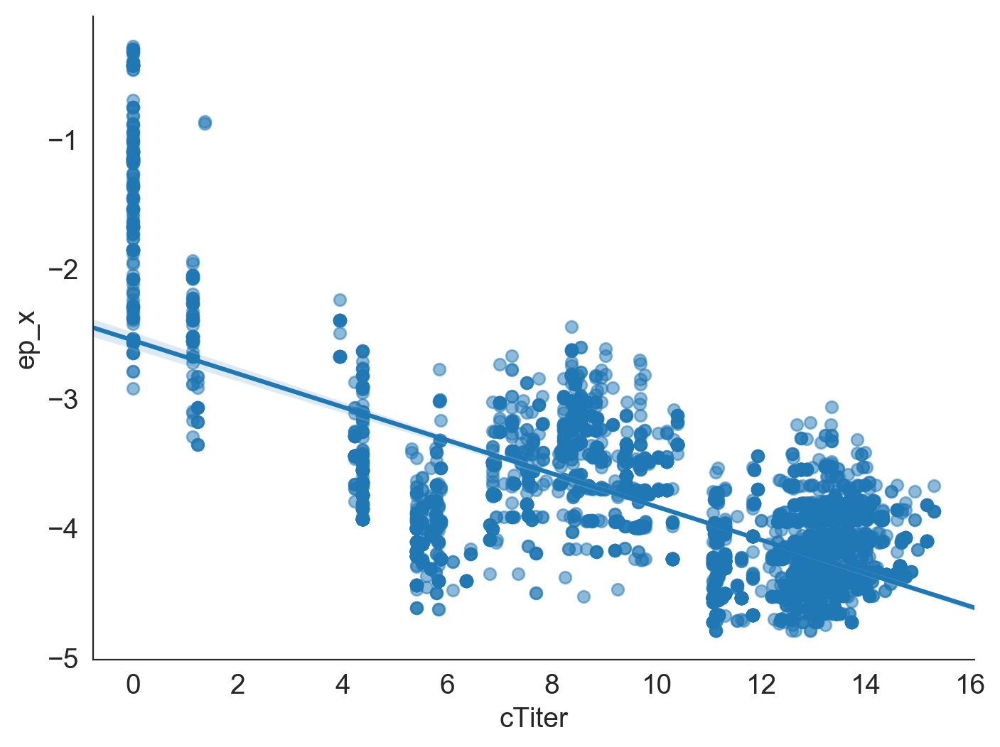

In [45]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

In [46]:
d_ep = np.arange(0, 21)

In [47]:
d_init = 14.0

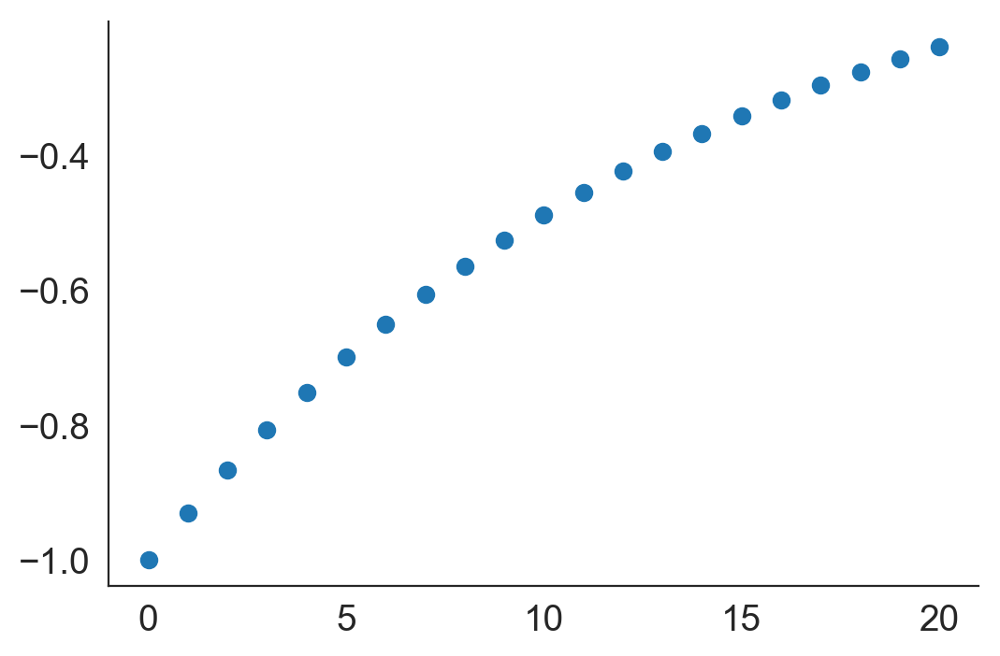

In [48]:
plt.plot(d_ep, -np.exp(-d_ep / float(d_init)), "o")

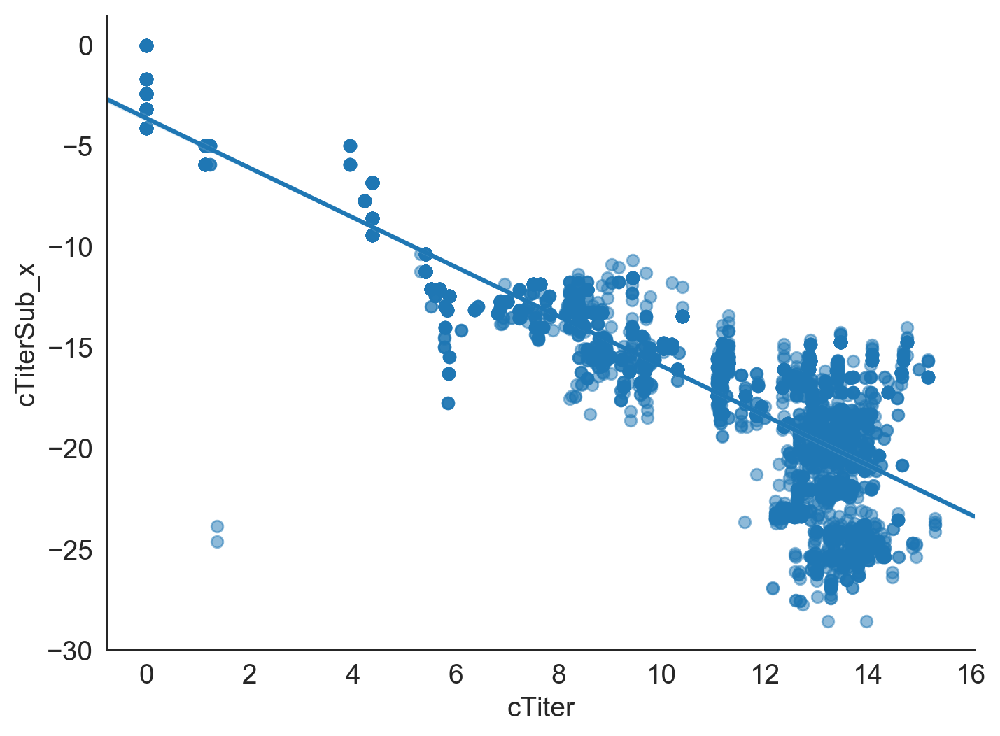

In [49]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("cTiter", "cTiterSub_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

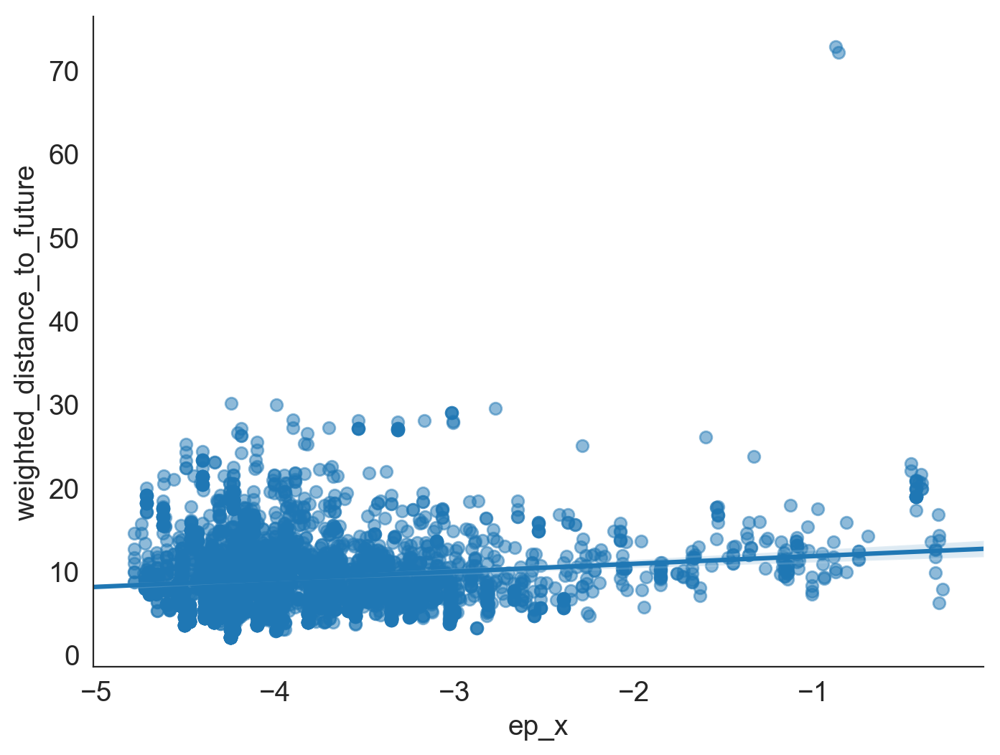

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("ep_x", "weighted_distance_to_future", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

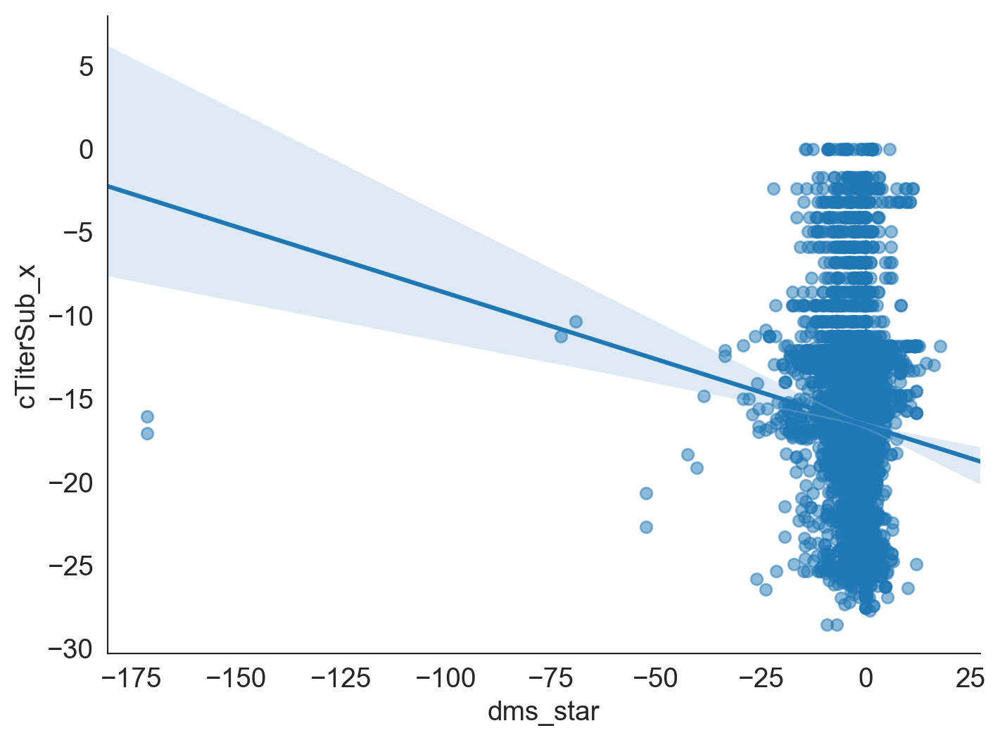

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "cTiterSub_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

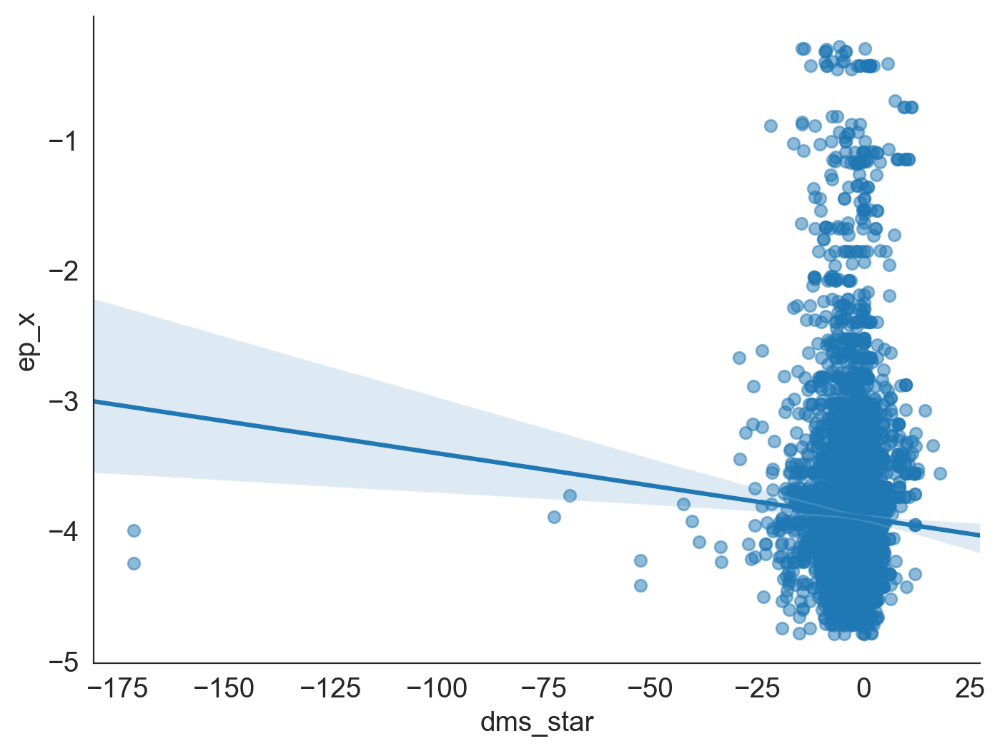

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.regplot("dms_star", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5}, ax=ax)

In [53]:
tip_attributes_df.loc[tip_attributes_df["dms_star"] < -15, ["timepoint", "strain", "cTiterSub_x", "ep_x", "dms_star", "frequency", "raw_date"]].head()

,timepoint,strain,cTiterSub_x,ep_x,dms_star,frequency,raw_date
60,1996-10-01,A/Fujian/202/1996,-2.389490,-1.025273,-16.53,0.036883,1996-07-02
97,1996-10-01,A/Shanghai/15/1996,-2.389490,-0.885065,-21.97,0.036466,1996-07-25
159,1997-10-01,A/Beijing/259/1996,-4.087371,-2.284308,-16.58,0.000022,1996-12-23
261,1998-10-01,A/Hangzhou/16/1998,-5.899979,-2.267184,-15.67,0.018071,1998-04-03
408,2000-04-01,A/Bangkok/178/2000,-8.576225,-3.740443,-17.46,0.011845,2000-03-28


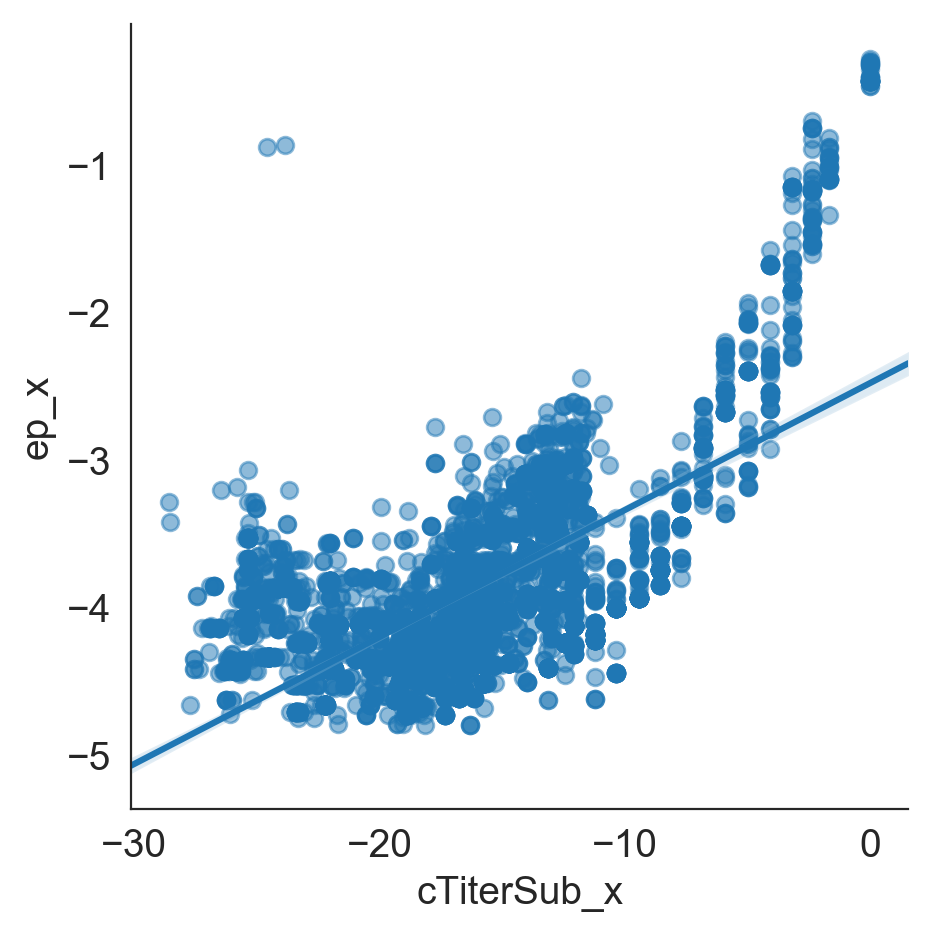

In [54]:
sns.lmplot("cTiterSub_x", "ep_x", tip_attributes_df, scatter_kws={"alpha": 0.5})

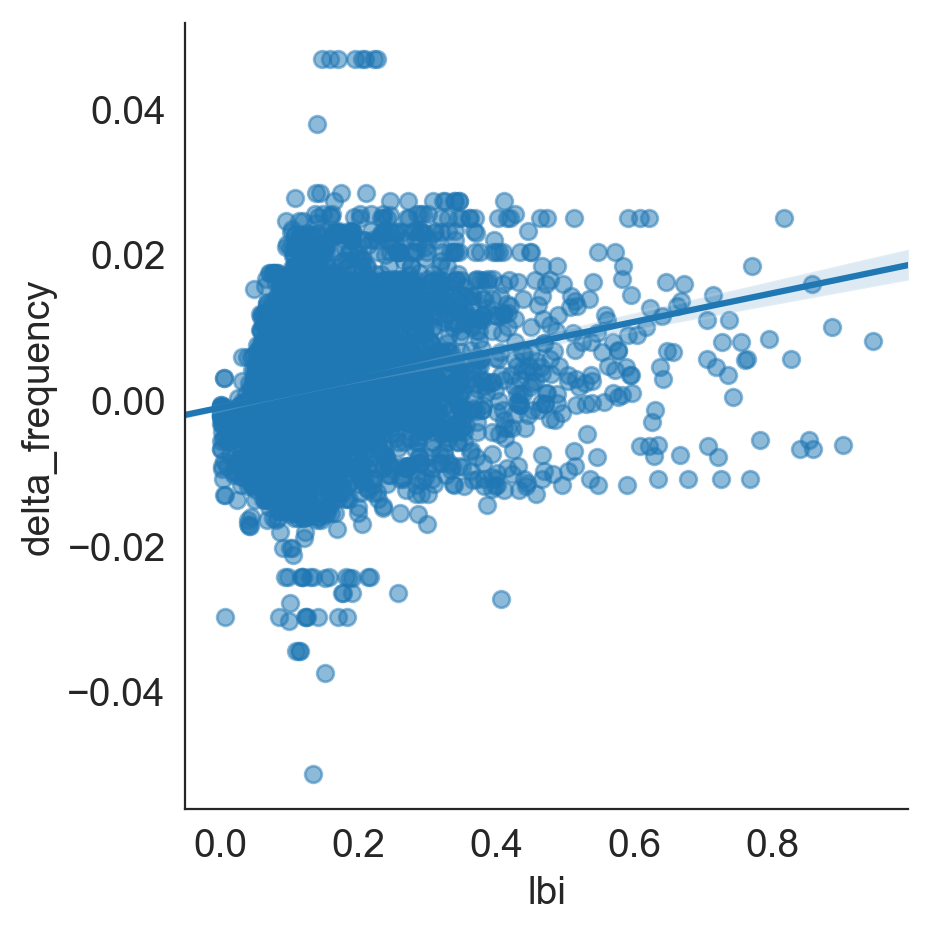

In [55]:
sns.lmplot("lbi", "delta_frequency", tip_attributes_df, scatter_kws={"alpha": 0.5})

## Summarize model residuals
[back to top](#Summarize-models)

In [56]:
residuals_by_timepoint = residual_df.groupby(["predictors", "timepoint"])["residual"].sum().reset_index()

In [57]:
residuals_by_timepoint.head()

,predictors,timepoint,residual
0,cTiter,1995-10-01,248.575304
1,cTiter,1996-04-01,210.005918
2,cTiter,1996-10-01,567.442424
3,cTiter,1997-04-01,334.319242
4,cTiter,1997-10-01,187.465753


In [58]:
residuals_by_timepoint.groupby("predictors")["residual"].sum()

predictors
cTiter                      108910.310493
cTiterSub                    92696.135904
cTiterSub_star               91366.016997
cTiterSub_x                  86557.709155
delta_frequency             106003.029353
dms_star                     95719.793506
ep                           79701.681633
ep_star                      95302.429265
ep_x                         81404.496004
lbi                         157738.202535
lbi-cTiterSub_x-dms_star    154308.052284
lbi-ep_x-ne_star            150430.508815
lbi-ne_star                 162663.717089
naive                        87432.786430
ne_star                     135233.561132
Name: residual, dtype: float64

In [59]:
model_name = "lbi"

In [60]:
model_residuals_by_timepoint = residuals_by_timepoint[residuals_by_timepoint["predictors"] == model_name]

In [61]:
max_lags = 18

Text(0,0.5,'Number of clades')

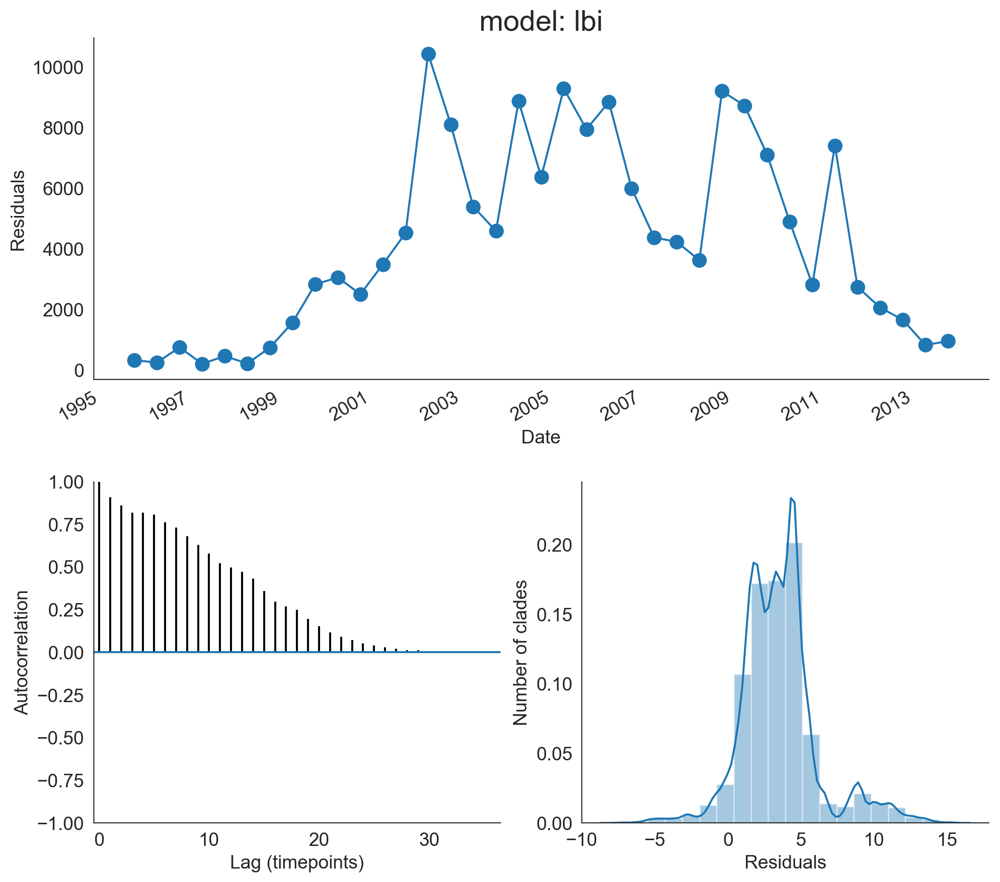

In [62]:
fig = plt.figure(figsize=(12, 12))
gs = gridspec.GridSpec(2, 2)
gs.update(hspace=0.3)

ax1 = plt.subplot(gs[0, :])
ax1.plot(model_residuals_by_timepoint["timepoint"], model_residuals_by_timepoint["residual"], "o-", markersize=10)
ax1.set_xlabel("Date")
ax1.set_ylabel("Residuals")
ax1.set_title("model: %s" % model_name)
plt.gcf().autofmt_xdate()

ax2 = plt.subplot(gs[1, :-1])
max_lags = len(model_residuals_by_timepoint["residual"]) - 1
lags, autocorrelation, lines, horizonal_lines = ax2.acorr(
    model_residuals_by_timepoint["residual"],
    maxlags=max_lags
)
ax2.set_xlabel("Lag (timepoints)")
ax2.set_ylabel("Autocorrelation")
ax2.set_xlim(-0.5, max_lags + 0.5)
ax2.set_ylim(-1, 1)

ax3 = plt.subplot(gs[1:, -1])
sns.distplot(residual_df.loc[residual_df["predictors"] == model_name, "residual"], ax=ax3, bins=20)
ax3.set_xlabel("Residuals")
ax3.set_ylabel("Number of clades")

### Residuals by predictor

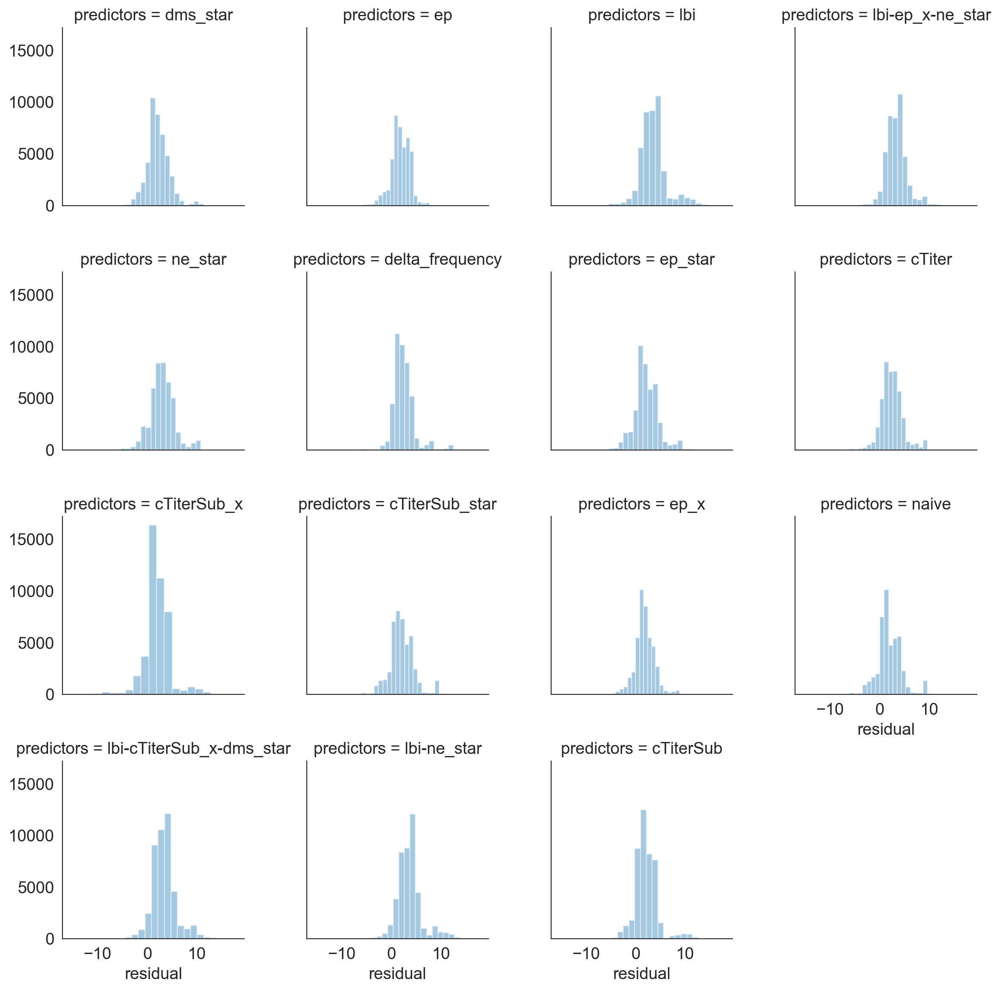

In [63]:
g = sns.FacetGrid(residual_df, col="predictors", col_wrap=4)
g.map(sns.distplot, "residual", bins=20, kde=False)

In [64]:
residual_df.groupby("predictors")["residual"].median().sort_values()

predictors
naive                       1.532036
ep_x                        1.697687
cTiterSub_x                 1.724565
ep                          1.735631
dms_star                    1.811884
cTiterSub                   1.834502
cTiterSub_star              1.859705
ep_star                     1.907312
delta_frequency             2.051328
cTiter                      2.344435
ne_star                     2.818623
lbi-cTiterSub_x-dms_star    3.310330
lbi-ep_x-ne_star            3.331866
lbi                         3.347264
lbi-ne_star                 3.509915
Name: residual, dtype: float64

In [65]:
residual_df.groupby("predictors")["residual"].count()

predictors
cTiter                      44927
cTiterSub                   44927
cTiterSub_star              44927
cTiterSub_x                 44927
delta_frequency             44927
dms_star                    44927
ep                          44927
ep_star                     44927
ep_x                        44927
lbi                         44927
lbi-cTiterSub_x-dms_star    44927
lbi-ep_x-ne_star            44927
lbi-ne_star                 44927
naive                       44927
ne_star                     44927
Name: residual, dtype: int64

In [66]:
(residual_df["residual"] < -0.01).sum()

64754

### Residuals by timepoint

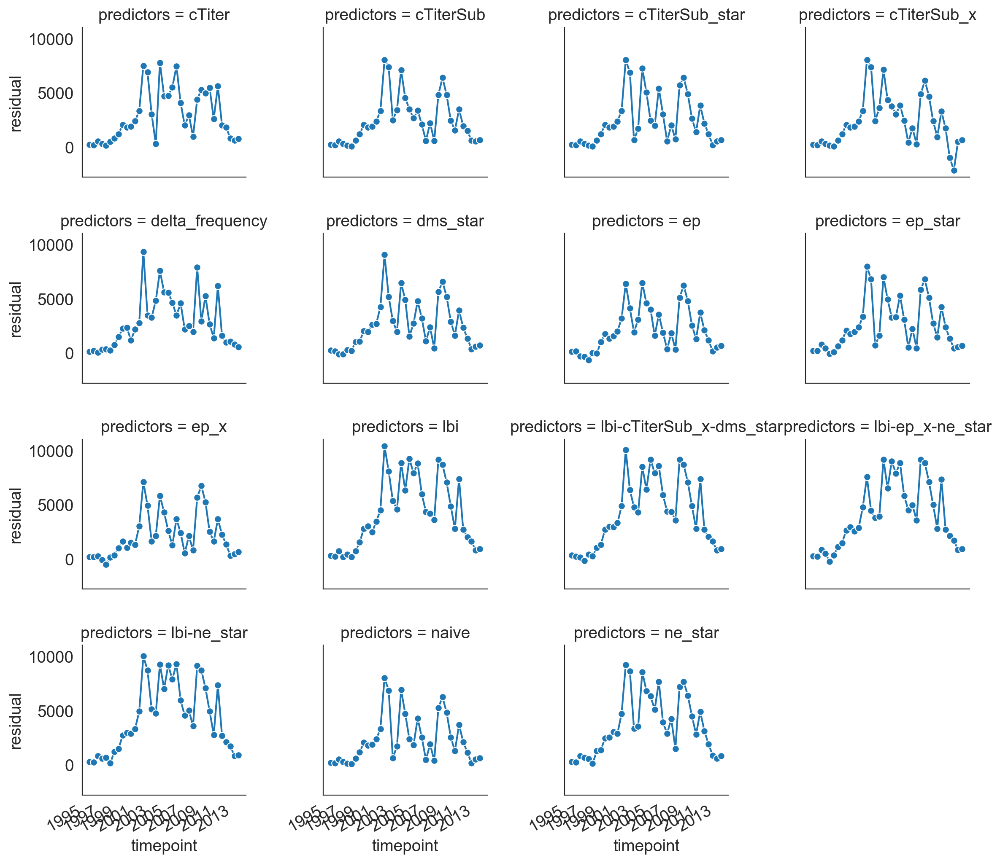

In [67]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(sns.lineplot, "timepoint", "residual", marker="o", linestyle="")
plt.gcf().autofmt_xdate()

In [68]:
np.abs(residuals_by_timepoint[residuals_by_timepoint["predictors"] == "lbi"]["residual"].values - residuals_by_timepoint[residuals_by_timepoint["predictors"] == "naive"]["residual"].values)

array([  86.1560817 ,   49.09575928,  191.4326544 ,  120.10976797,
        284.9350549 ,  100.11512092,  104.43193911,  350.45947486,
        730.73967449, 1228.38194959,  578.30245482, 1090.14373499,
       1156.70902077, 2383.45375647, 1198.22330083, 4740.53424106,
       2823.90658451, 1914.68005719, 1611.75473334, 6876.7367965 ,
       6081.62335479, 4522.74175056, 3421.70932527, 3880.15408771,
       2288.42551995, 3187.79186727, 3916.50099378, 2424.01718788,
       2248.22231834, 2306.64912576, 1501.70787198, 3675.91120919,
        591.84235983,  869.21599167, 1456.09214637,  281.14373895,
        271.58463312])

### Autocorrelation of residuals

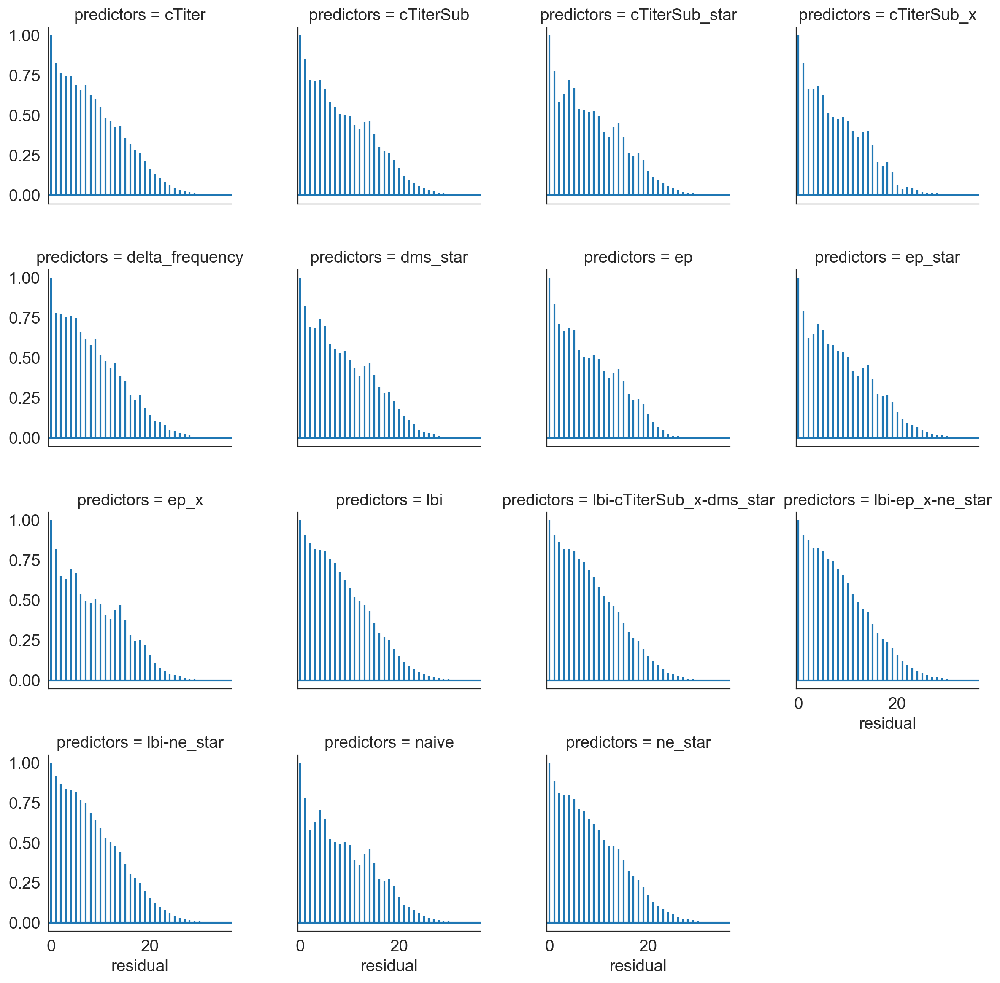

In [69]:
g = sns.FacetGrid(residuals_by_timepoint, col="predictors", col_wrap=4)
g.map(plt.acorr, "residual", maxlags=max_lags)

for ax in g.axes.flatten():
    ax.set_xlim(-0.5, max_lags + 0.5)

## Summarize observed and predicted distances
[back to top](#Summarize-models)

$$
d_{i}(x(t)) = \sum_{j}x_{j}d_{ij}
$$

$$
u = t + \Delta{t}
$$

$$
\hat{x}_{i}(t, u) = x_{i}(t)e^{(f_{i}(t)(u - t))}
$$

$$
y = x_{i}(t)d_{i}(x(u))
$$

$$
\hat{y} = x_{i}(t)d_{i}(\hat{x}(t, u))
$$

$$
D(x(t), x(u)) = \sum_{i}x_{i}d_{i}(u)
$$

$$
D(\hat{x}(t, u), x(u)) = \sum_{i}x_{i}e^{(f_{i}(t)(u - t))}d_{i}(u)
$$

$$
L = \sum_{t}D(\hat{x}(t, u), x(u))
$$

In [70]:
frequency_df[frequency_df["predictors"] == "lbi"].head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors
9534,0.122157,0.000937,0.000391,A/Akita/69/2002,2002-10-01,17.593260,8.578387,9.195598,17.593260,17.593260,8.397662,2002-10-01,lbi
9535,-1.202985,0.015340,0.001699,A/Argentina/1/2002,2002-10-01,18.535951,12.900892,13.209975,18.535951,18.535951,5.325976,2002-10-01,lbi
9536,0.522866,0.016621,0.010343,A/Auckland/26/2002,2002-10-01,18.606443,9.420419,9.376860,18.606443,18.606443,9.229583,2002-10-01,lbi
9537,-0.376747,0.012752,0.003228,A/Auckland/611/2002,2002-10-01,18.637487,9.550487,9.425591,18.637487,18.637487,9.211896,2002-10-01,lbi
9538,-0.292769,0.000092,0.000025,A/Auckland/614/2002,2002-10-01,19.548135,10.420580,11.144322,19.548135,19.548135,8.403813,2002-10-01,lbi


In [71]:
frequency_df["observed_rank"] = frequency_df["y"] # / frequency_df["frequency"]
frequency_df["estimated_rank"] = frequency_df["y_hat"] # / frequency_df["frequency"]

In [72]:
data_to_plot = frequency_df[frequency_df["predictors"] == "lbi"]

In [73]:
minimum_observed_distance = data_to_plot.groupby("validation_timepoint")["observed_rank"].min().reset_index()

In [74]:
minimum_estimated_distance = data_to_plot.groupby("validation_timepoint")["estimated_rank"].min().reset_index()

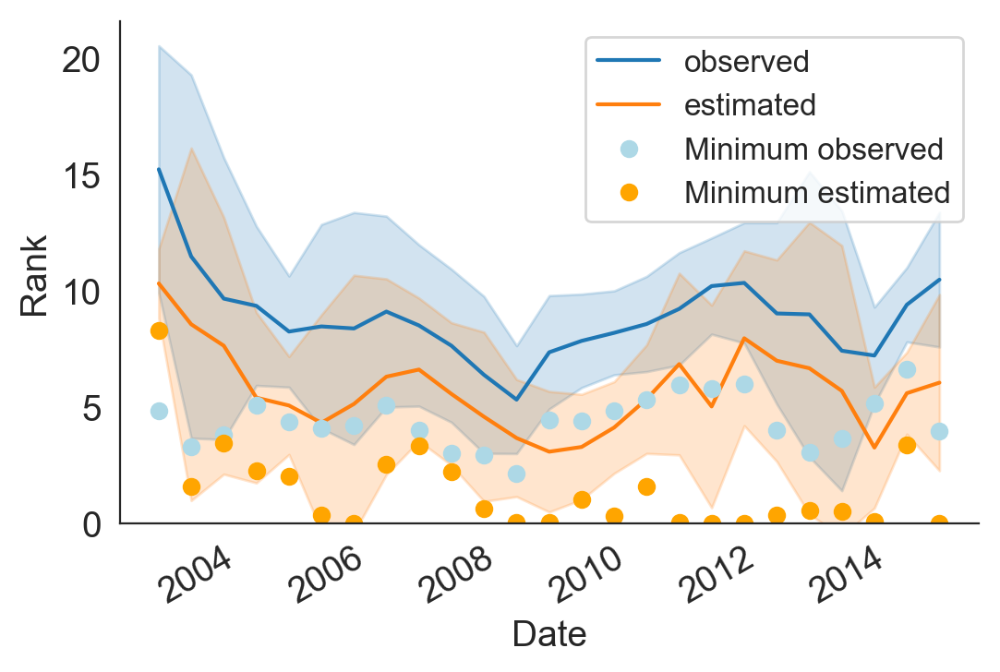

In [75]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax = sns.lineplot(
    "validation_timepoint",
    "observed_rank",
    data=data_to_plot,
    ci="sd",
    label="observed",
    ax=ax
)

ax = sns.lineplot(
    "validation_timepoint",
    "estimated_rank",
    data=data_to_plot,
    ci="sd",
    label="estimated",
    ax=ax
)

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o",
    color="lightblue",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o",
    color="orange",
    label="Minimum estimated"
)

ax.legend()
ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
plt.gcf().autofmt_xdate()

In [76]:
vaccine_strains = [
    "A/Wisconsin/67/2005",
    "A/Brisbane/10/2007",
    "A/Perth/16/2009",
    "A/Victoria/361/2011",
    "A/Texas/50/2012",
    "A/Switzerland/9715293/2013",
    "A/HongKong/4801/2014"
]

In [77]:
vaccine_strain_data_to_plot = data_to_plot.loc[data_to_plot["strain"].isin(vaccine_strains),
                                               ["strain", "validation_timepoint", "observed_rank", "estimated_rank"]]

In [78]:
vaccine_strain_data_to_plot

,strain,validation_timepoint,observed_rank,estimated_rank
11937,A/Perth/16/2009,2009-10-01,7.644543,3.766874
13048,A/Victoria/361/2011,2012-04-01,6.371600,3.122750
13265,A/Texas/50/2012,2012-10-01,5.459827,3.232140
13855,A/HongKong/4801/2014,2014-04-01,6.627756,8.892492
13992,A/Switzerland/9715293/2013,2014-04-01,8.214531,4.976608
14107,A/HongKong/4801/2014,2014-10-01,3.956587,9.999930


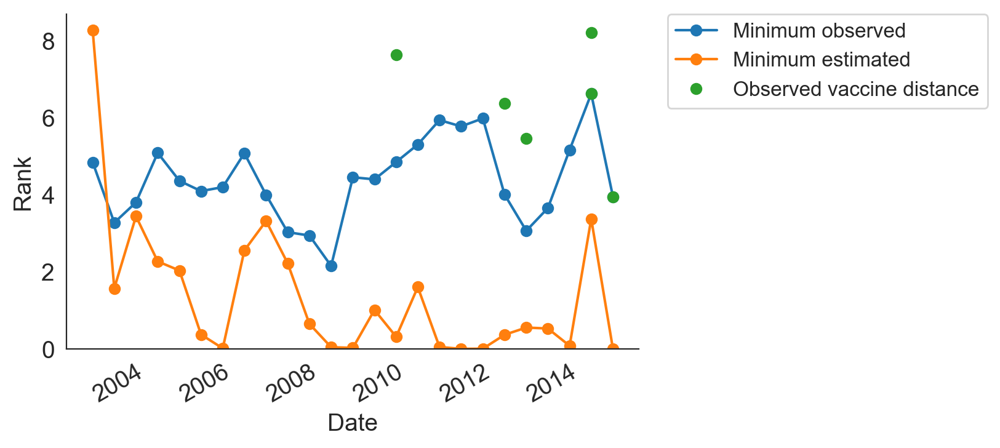

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(6, 4))

ax.plot(
    minimum_observed_distance["validation_timepoint"],
    minimum_observed_distance["observed_rank"],
    "o-",
    label="Minimum observed"
)

ax.plot(
    minimum_estimated_distance["validation_timepoint"],
    minimum_estimated_distance["estimated_rank"],
    "o-",
    label="Minimum estimated"
)

ax.plot(
    vaccine_strain_data_to_plot["validation_timepoint"],
    vaccine_strain_data_to_plot["observed_rank"],
    "o",
    label="Observed vaccine distance"
)

ax.set_xlabel("Date")
ax.set_ylabel("Rank")
ax.set_ylim(bottom=0)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.gcf().autofmt_xdate()

In [80]:
regressions = []
for predictors, group_df in frequency_df.groupby(["predictors"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions.append({
        "predictors": predictors,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "r_2": r_value ** 2,
        "p_value": p_value
    })

regressions = pd.DataFrame(regressions).sort_values(by="r_2", ascending=False)

In [81]:
regressions

,intercept,p_value,predictors,r_2,r_value,slope
4,-1.596477,0.0,delta_frequency,0.827967,0.909927,0.929725
11,-2.171995,0.0,lbi-ep_x-ne_star,0.734511,0.857036,0.923968
9,-2.254801,0.0,lbi,0.727936,0.853191,0.896351
5,0.247862,0.0,dms_star,0.725466,0.851743,0.747909
12,-2.187208,0.0,lbi-ne_star,0.718472,0.847627,0.873046
13,0.840189,0.0,naive,0.704748,0.839493,0.689503
6,0.574639,0.0,ep,0.704142,0.839132,0.741680
0,-0.394485,0.0,cTiter,0.702176,0.837959,0.798665
14,-0.215024,0.0,ne_star,0.683277,0.826606,0.698698
8,1.082748,0.0,ep_x,0.680462,0.824901,0.702995


In [82]:
regressions_order = regressions["predictors"].values

In [83]:
regressions_order

array(['delta_frequency', 'lbi-ep_x-ne_star', 'lbi', 'dms_star',
       'lbi-ne_star', 'naive', 'ep', 'cTiter', 'ne_star', 'ep_x',
       'cTiterSub_star', 'ep_star', 'lbi-cTiterSub_x-dms_star',
       'cTiterSub', 'cTiterSub_x'], dtype=object)

In [84]:
final_frequency_df = frequency_df[frequency_df["predictors"].isin(best_models)].copy()

In [85]:
final_frequency_df["predictors_name"] = final_frequency_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [86]:
final_frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,predictors_name
0,0.844549,0.000937,0.000873,A/Akita/69/2002,2002-10-01,17.593260,8.578387,12.124272,17.593260,17.593260,5.468988,2002-10-01,dms_star,17.593260,12.124272,DMS phenotypes
1,0.274197,0.015340,0.008081,A/Argentina/1/2002,2002-10-01,18.535951,12.900892,14.279906,18.535951,18.535951,4.256045,2002-10-01,dms_star,18.535951,14.279906,DMS phenotypes
2,0.538061,0.016621,0.011400,A/Auckland/26/2002,2002-10-01,18.606443,9.420419,13.016532,18.606443,18.606443,5.589911,2002-10-01,dms_star,18.606443,13.016532,DMS phenotypes
3,0.172711,0.012752,0.006069,A/Auckland/611/2002,2002-10-01,18.637487,9.550487,13.049181,18.637487,18.637487,5.588306,2002-10-01,dms_star,18.637487,13.049181,DMS phenotypes
4,-0.547840,0.000092,0.000021,A/Auckland/614/2002,2002-10-01,19.548135,10.420580,13.949206,19.548135,19.548135,5.598929,2002-10-01,dms_star,19.548135,13.949206,DMS phenotypes


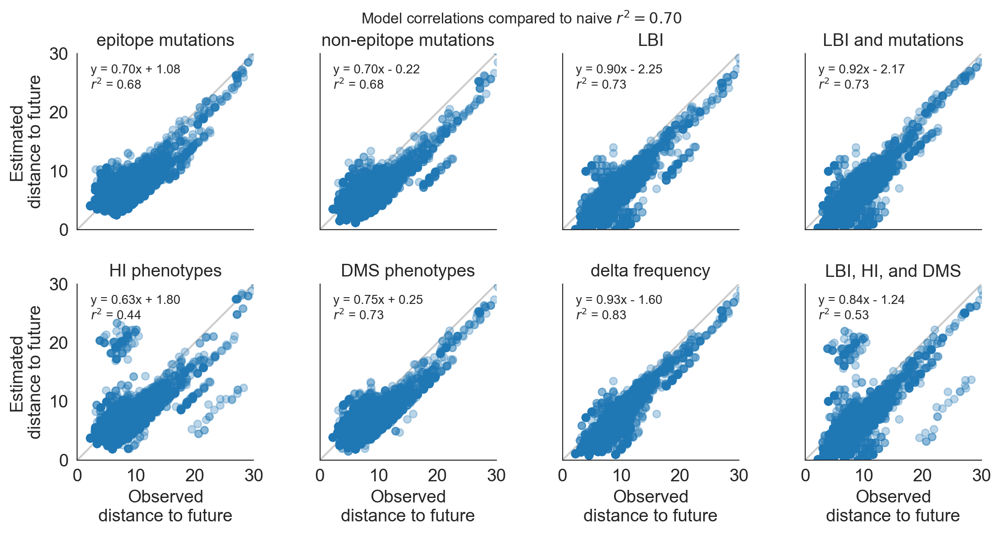

In [87]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(final_frequency_df, col="predictors_name", col_wrap=4, col_order=best_predictor_names)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")
g.set_axis_labels("Observed\ndistance to future", "Estimated\ndistance to future")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    if intercept < 0:
        intercept_operator = "-"
        intercept = -intercept
    else:
        intercept_operator = "+"
    
    ax.text(
        0.075,
        0.8,
        "y = %.2fx %s %.2f\n$r^2$ = %.2f%s" % (slope, intercept_operator, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.suptitle(
    "Model correlations compared to naive $r^2 = %.2f$" % regressions.loc[regressions["predictors"] == "naive", "r_2"].values[0],
    fontsize=12,
    y=1.0
)
plt.subplots_adjust(hspace=0.75, top=0.75, wspace=0.05)
plt.tight_layout()

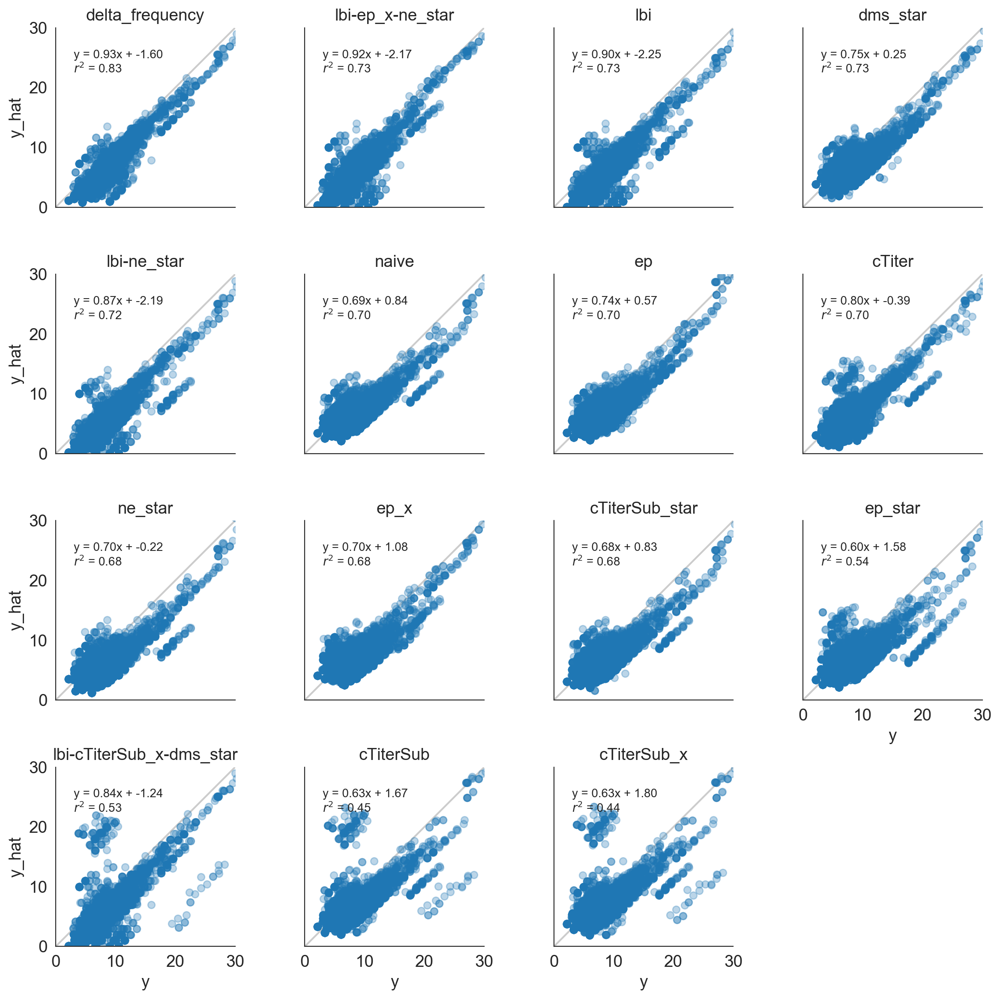

In [88]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, col="predictors", col_wrap=4, col_order=regressions_order)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value = regressions.loc[
        regressions["predictors"] == facet_df["predictors"].unique()[0],
        ["slope", "intercept", "r_value", "p_value"]
    ].values[0]
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

Text(0.35,0.75,'mean = 8.78')

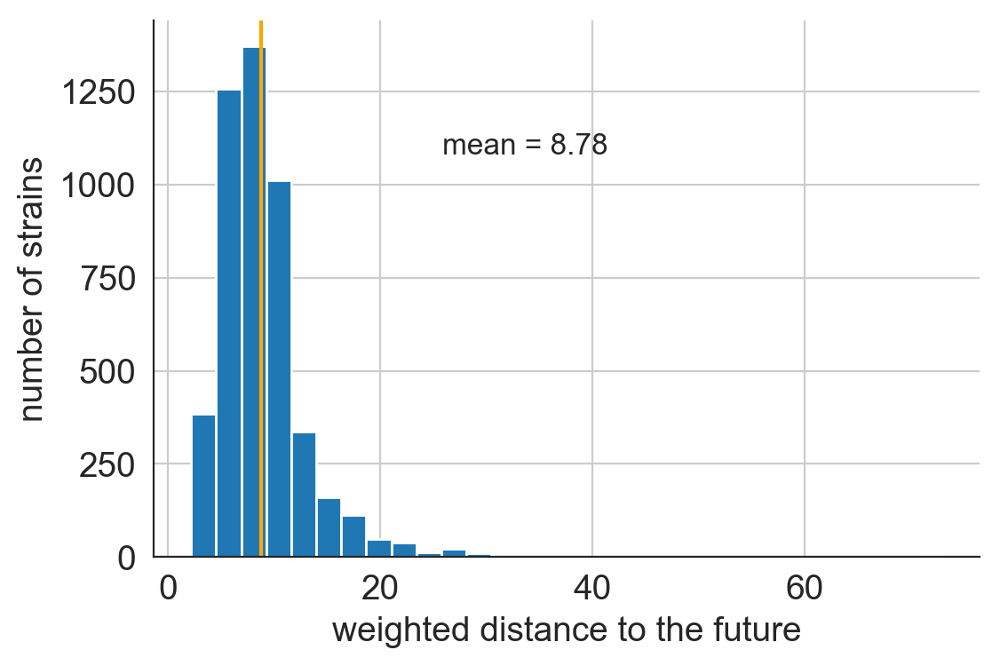

In [89]:
ax = frequency_df[frequency_df["predictors"] == "naive"]["y"].hist(bins=30)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of strains")

mean_y = frequency_df[frequency_df["predictors"] == "naive"]["y"].mean()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.35,
    0.75,
    "mean = %.2f" % (mean_y,),
    transform=ax.transAxes,
    fontsize=12
)


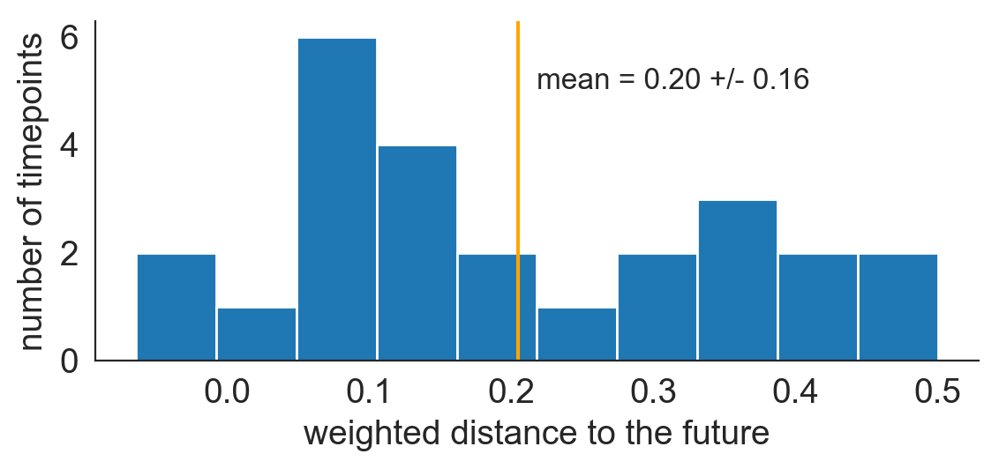

In [90]:
fig, ax = plt.subplots(1, 1, figsize=(6, 3))
ax.hist(errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"], bins=10)
ax.set_xlabel("weighted distance to the future")
ax.set_ylabel("number of timepoints")

mean_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].mean()
std_y = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].std()
ax.axvline(
    x=mean_y,
    color="orange"
)

ax.text(
    0.5,
    0.8,
    "mean = %.2f +/- %.2f" % (mean_y, std_y),
    transform=ax.transAxes,
    fontsize=12,
    horizontalalignment="left"
)

plt.tight_layout()
plt.savefig("../manuscript/figures/distance-of-natural-populations-between-timepoints.png")

In [91]:
best_models = [
    "naive",
    "lbi-dms_star-cTiterSub_x",
    "lbi-delta_frequency",
    "lbi",
    "lbi-ep_x-ne_star"
]

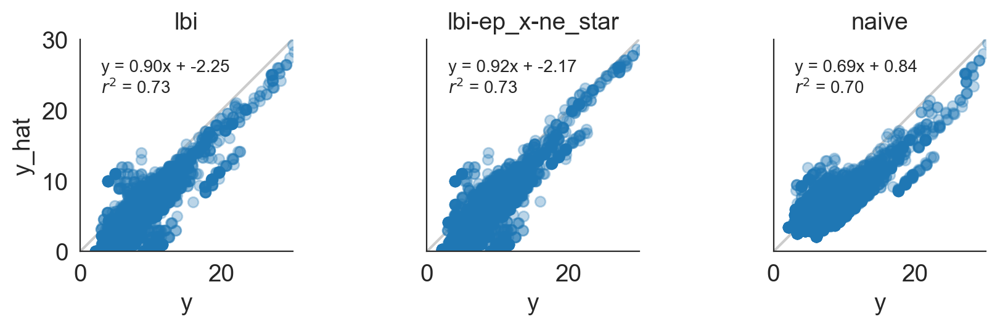

In [92]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], col="predictors", col_wrap=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=10
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)

In [93]:
frequency_df["year_month"] = frequency_df["validation_timepoint"].dt.strftime("%Y-%m")
frequency_df["year"] = frequency_df["validation_timepoint"].dt.strftime("%Y")

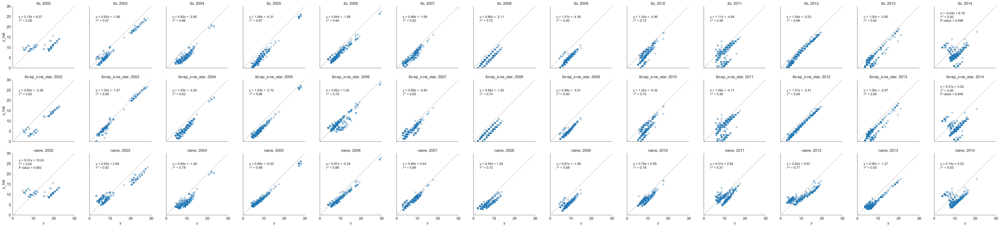

In [94]:
max_y = 30
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df[frequency_df["predictors"].isin(best_models)], row="predictors", col="year", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()

In [95]:
frequency_df.head()

,fitness,frequency,projected_frequency,strain,timepoint,weighted_distance_to_future_hat,weighted_distance_to_present,y_hat,weighted_distance_to_future,y,residual,validation_timepoint,predictors,observed_rank,estimated_rank,year_month,year
0,0.844549,0.000937,0.000873,A/Akita/69/2002,2002-10-01,17.593260,8.578387,12.124272,17.593260,17.593260,5.468988,2002-10-01,dms_star,17.593260,12.124272,2002-10,2002
1,0.274197,0.015340,0.008081,A/Argentina/1/2002,2002-10-01,18.535951,12.900892,14.279906,18.535951,18.535951,4.256045,2002-10-01,dms_star,18.535951,14.279906,2002-10,2002
2,0.538061,0.016621,0.011400,A/Auckland/26/2002,2002-10-01,18.606443,9.420419,13.016532,18.606443,18.606443,5.589911,2002-10-01,dms_star,18.606443,13.016532,2002-10,2002
3,0.172711,0.012752,0.006069,A/Auckland/611/2002,2002-10-01,18.637487,9.550487,13.049181,18.637487,18.637487,5.588306,2002-10-01,dms_star,18.637487,13.049181,2002-10,2002
4,-0.547840,0.000092,0.000021,A/Auckland/614/2002,2002-10-01,19.548135,10.420580,13.949206,19.548135,19.548135,5.598929,2002-10-01,dms_star,19.548135,13.949206,2002-10,2002


In [96]:
regressions_by_time = []
for (predictors, timepoint), group_df in frequency_df.groupby(["predictors", "timepoint"]):
    slope, intercept, r_value, p_value, std_err = linregress(
        group_df["y"],
        group_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": predictors,
        "timepoint": timepoint,
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })

regressions_by_time = pd.DataFrame(regressions_by_time)

In [97]:
regressions_by_time.head()

,intercept,p_value,predictors,r_value,slope,timepoint
0,10.127276,6.394797e-01,cTiter,0.045156,0.011671,2002-10-01
1,-1.404445,1.965508e-125,cTiter,0.996447,0.945981,2003-04-01
2,9.245164,3.537543e-37,cTiter,0.833889,0.437458,2003-10-01
3,-5.289312,4.967022e-115,cTiter,0.982493,1.140173,2004-04-01
4,-0.491952,3.619092e-72,cTiter,0.940431,0.762240,2004-10-01


In [98]:
naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] == "naive"]
non_naive_regressions_by_time = regressions_by_time[regressions_by_time["predictors"] != "naive"]

In [99]:
"""
max_y = 25
x = y = np.linspace(0, max_y, 10)

g = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)
g.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)
g.set_titles("{row_name}, {col_name}")

regressions_by_time = []
for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    slope, intercept, r_value, p_value, std_err = linregress(
        facet_df["y"],
        facet_df["y_hat"]
    )
    
    regressions_by_time.append({
        "predictors": facet_df["predictors"].unique()[0],
        "timepoint": facet_df["timepoint"].unique()[0],
        "slope": slope,
        "intercept": intercept,
        "r_value": r_value,
        "p_value": p_value
    })
    
    if p_value > 0.001:
        p_value = "\nP value = %.3f" % p_value
    else:
        p_value = ""
    
    ax.plot(x, y, color="#cccccc", zorder=-10)
    
    ax.text(
        0.1,
        0.75,
        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slope, intercept, r_value ** 2, p_value),
        transform=ax.transAxes,
        fontsize=12
    )
    ax.set_aspect("equal")
    ax.set_xlim(0, max_y)
    ax.set_ylim(0, max_y)
    
plt.tight_layout()"""

'\nmax_y = 25\nx = y = np.linspace(0, max_y, 10)\n\ng = sns.FacetGrid(frequency_df, row="predictors", col="year_month", height=4)\ng.map(plt.plot, "y", "y_hat", marker="o", linestyle="", alpha=0.3)\ng.set_titles("{row_name}, {col_name}")\n\nregressions_by_time = []\nfor ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):\n    slope, intercept, r_value, p_value, std_err = linregress(\n        facet_df["y"],\n        facet_df["y_hat"]\n    )\n    \n    regressions_by_time.append({\n        "predictors": facet_df["predictors"].unique()[0],\n        "timepoint": facet_df["timepoint"].unique()[0],\n        "slope": slope,\n        "intercept": intercept,\n        "r_value": r_value,\n        "p_value": p_value\n    })\n    \n    if p_value > 0.001:\n        p_value = "\nP value = %.3f" % p_value\n    else:\n        p_value = ""\n    \n    ax.plot(x, y, color="#cccccc", zorder=-10)\n    \n    ax.text(\n        0.1,\n        0.75,\n        "y = %.2fx + %.2f\n$r^2$ = %.2f%s" % (slop

## Summarize model forecasting error
[back to top](#Summarize-models)

### Earth mover's distances

Training and validation errors are reported as [earth mover's distances](https://en.wikipedia.org/wiki/Earth_mover%27s_distance). These values minimize the distance between observed and projected frequencies of tips at each timepoint with Hamming distance between amino acid sequences providing the ground distance between each pair of tips in respective timepoints.

In [100]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,0.105536,110,2002-10-01
1,dms_star,0.026840,117,2003-04-01
2,dms_star,0.296473,139,2003-10-01
3,dms_star,0.301177,157,2004-04-01
4,dms_star,0.128665,152,2004-10-01


In [101]:
distance_df = errors_by_time_df.groupby("predictors")["validation_error"].aggregate([
    "sum",
    "mean",
    "median"
]).sort_values(by="sum").reset_index()

In [102]:
distance_df

,predictors,sum,mean,median
0,lbi-ne_star,-1.587520,-0.063501,-0.085404
1,lbi,-1.477204,-0.059088,-0.083792
2,lbi-ep_x-ne_star,-1.168445,-0.046738,-0.088614
3,delta_frequency,-0.099235,-0.003969,-0.014589
4,lbi-cTiterSub_x-dms_star,0.668244,0.026730,-0.054215
5,cTiter,2.443235,0.097729,0.023164
6,ne_star,2.564457,0.102578,0.080686
7,dms_star,4.442978,0.177719,0.131031
8,cTiterSub_star,5.061220,0.202449,0.152575
9,ep,5.081058,0.203242,0.160298


In [103]:
distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0]

5.118976553425354

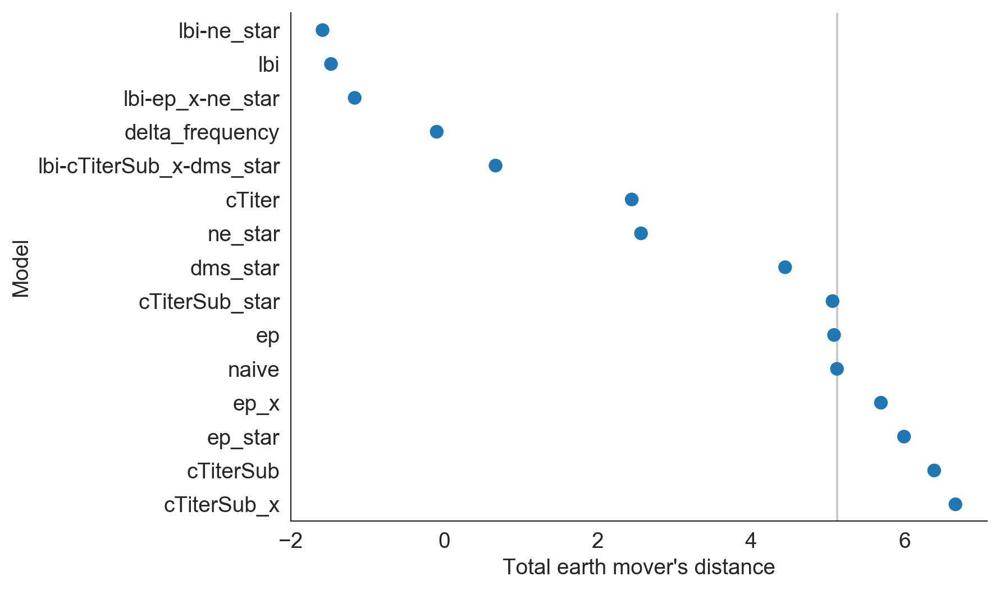

In [104]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="sum",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Total earth mover's distance")
ax.set_ylabel("Model")
ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "sum"].values[0],
    color="#cccccc",
    zorder=-10
)

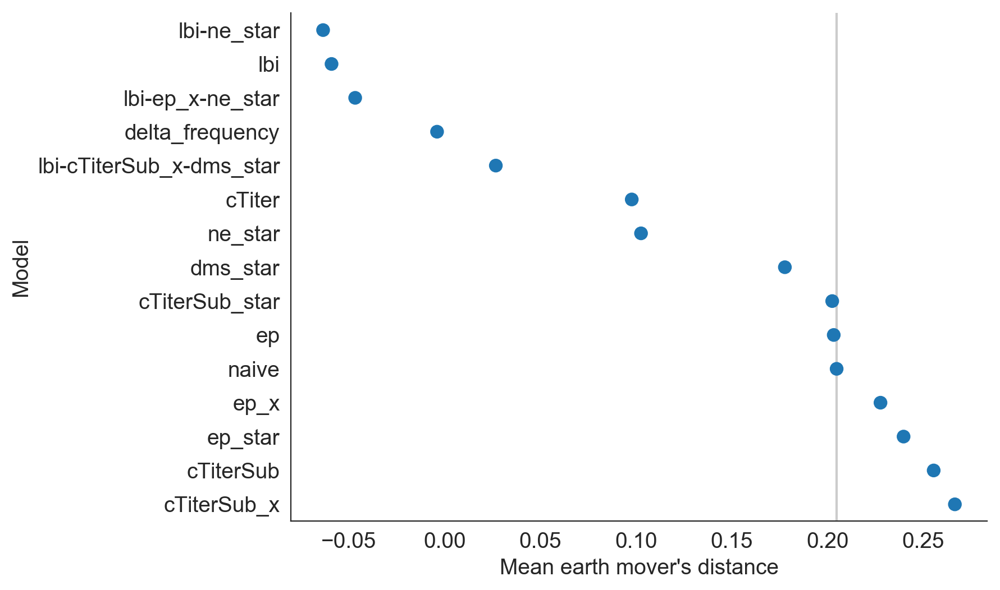

In [105]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="mean",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax
)

ax.set_xlabel("Mean earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "mean"].values[0],
    color="#cccccc",
    zorder=-10
)

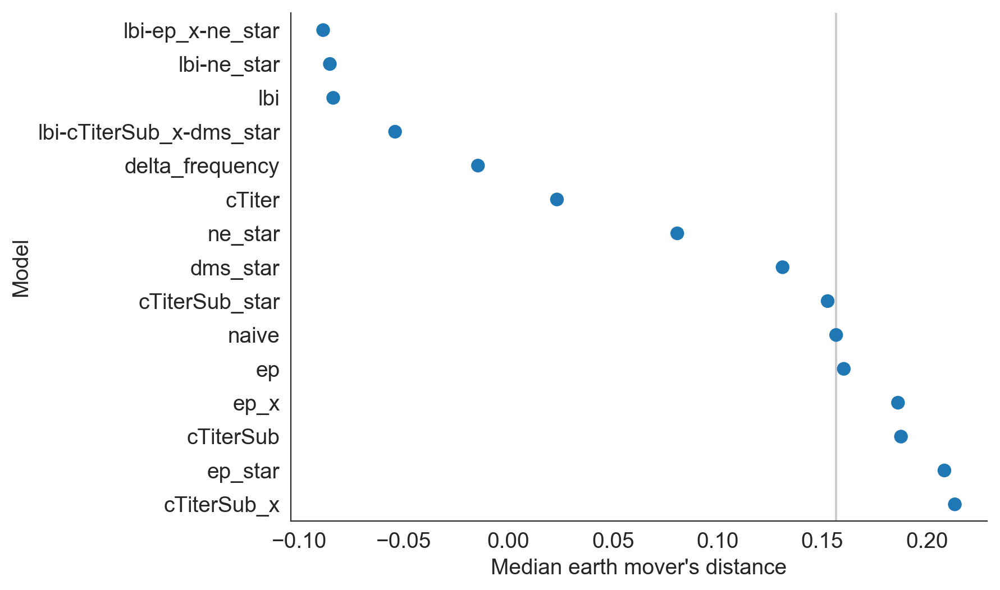

In [106]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
sns.pointplot(
    x="median",
    y="predictors",
    data=distance_df,
    join=False,
    ax=ax,
    order=distance_df.sort_values("median").loc[:, "predictors"]
)

ax.set_xlabel("Median earth mover's distance")
ax.set_ylabel("Model")

ax.axvline(
    x=distance_df.loc[distance_df["predictors"] == "naive", "median"].values[0],
    color="#cccccc",
    zorder=-10
)

In [107]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint
0,dms_star,0.105536,110,2002-10-01
1,dms_star,0.026840,117,2003-04-01
2,dms_star,0.296473,139,2003-10-01
3,dms_star,0.301177,157,2004-04-01
4,dms_star,0.128665,152,2004-10-01


In [108]:
predictor_type_order = [
    "naive",
    "ep",
    "cTiterSub",
    "ep_x",
    "cTiterSub_x",
    "ne_star",
    "dms_star",
    "lbi",
    "delta_frequency"
]

In [109]:
predictor_names = [
    "null",
    "epitope mutations",
    "HI phenotypes",
    "epitope cross-immunity",
    "HI cross-immunity",
    "non-epitope mutations",
    "DMS mutation effects",
    "LBI",
    "delta frequency"
]

In [110]:
"""
predictor_type_order = [
    "naive",
    "lbi"
]
predictor_names = predictor_type_order
"""

'\npredictor_type_order = [\n    "naive",\n    "lbi"\n]\npredictor_names = predictor_type_order\n'

In [111]:
predictor_name_by_id = dict(zip(predictor_type_order, predictor_names))

In [112]:
predictor_name_by_id

{'naive': 'null',
 'ep': 'epitope mutations',
 'cTiterSub': 'HI phenotypes',
 'ep_x': 'epitope cross-immunity',
 'cTiterSub_x': 'HI cross-immunity',
 'ne_star': 'non-epitope mutations',
 'dms_star': 'DMS mutation effects',
 'lbi': 'LBI',
 'delta_frequency': 'delta frequency'}

In [113]:
errors_by_time_df["predictors_name"] = errors_by_time_df["predictors"].map(predictor_name_by_id)

In [114]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
275,naive,0.395841,110,2002-10-01,null
276,naive,0.494600,117,2003-04-01,null
277,naive,0.360408,139,2003-10-01,null
278,naive,0.107849,157,2004-04-01,null
279,naive,0.097994,152,2004-10-01,null
280,naive,0.152901,165,2005-04-01,null
281,naive,0.102579,188,2005-10-01,null
282,naive,0.165764,193,2006-04-01,null
283,naive,0.394389,163,2006-10-01,null
284,naive,0.326024,166,2007-04-01,null


In [115]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

In [116]:
individual_median_errors = []
for predictor in predictor_type_order:
    individual_median_errors.append(
        distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0]
    )

In [117]:
median_error = errors_by_time_df.groupby("predictors")["validation_error"].median().reset_index().sort_values(by="validation_error")
median_error_order = median_error["predictors"].values

In [118]:
#median_error_order = [predictor for predictor in median_error_order if "-" not in predictor]

(0, 1.8644015982584028)

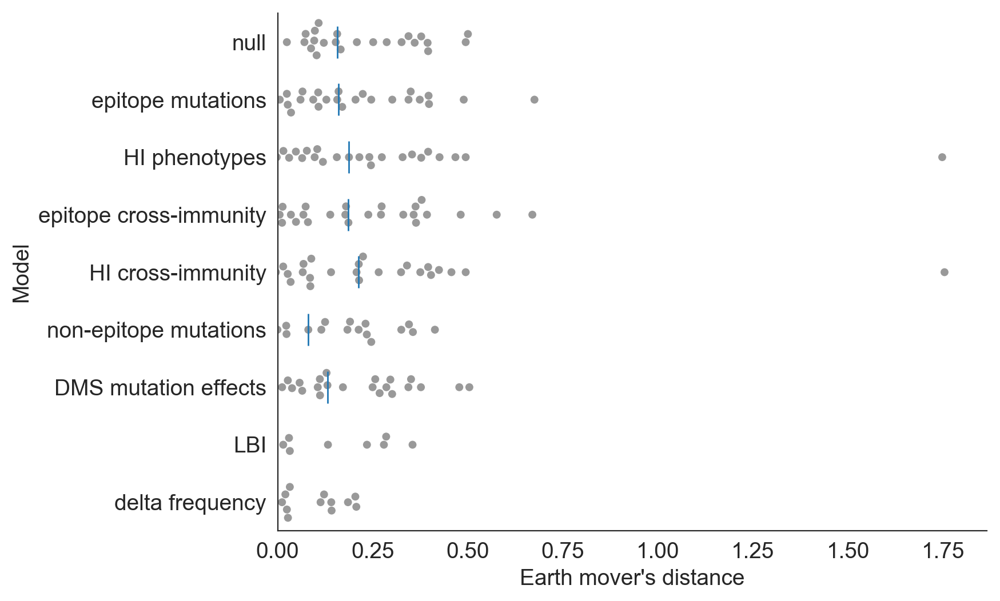

In [119]:
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

ax.plot(
    individual_median_errors,
    predictor_type_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=predictor_type_order,
    color="#999999",
    zorder=-10
)

ax.set_yticklabels(predictor_names)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")
ax.set_xlim(left=0)

Text(0,0.5,'Model')

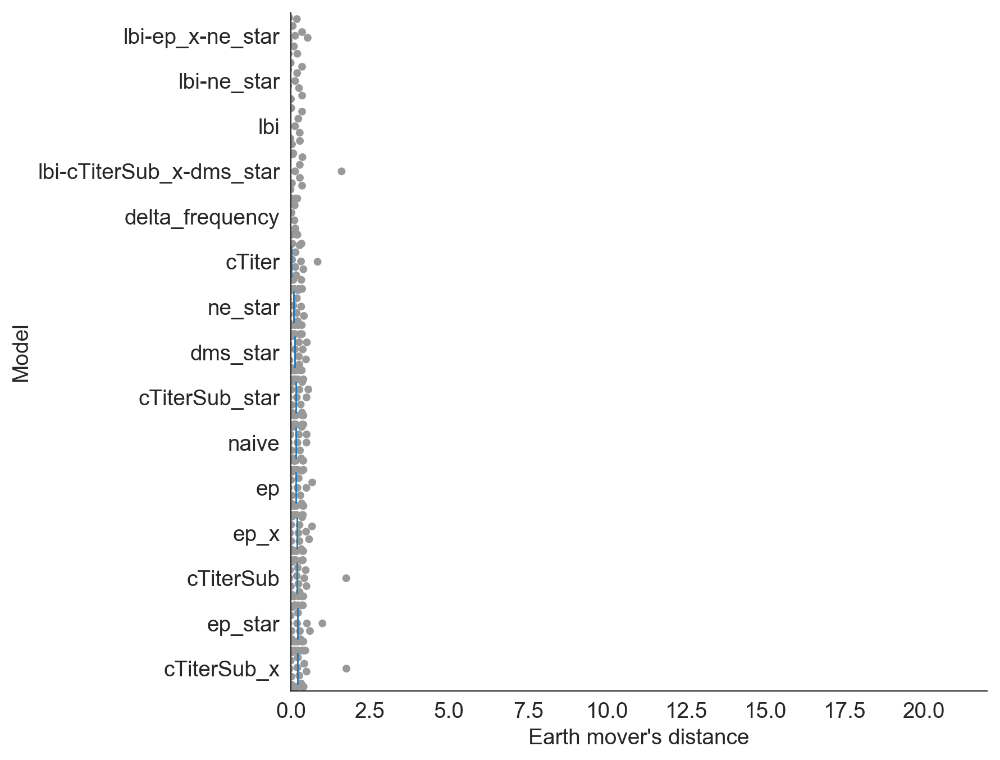

In [120]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(0, 22)

ax = sns.swarmplot(
    x="validation_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_error["validation_error"],
    median_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.set_xlabel("Earth mover's distance")
ax.set_ylabel("Model")

In [121]:
errors_by_time_df.sort_values(by=["predictors", "validation_timepoint"], ascending=False).head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
124,ne_star,0.246253,264,2014-10-01,non-epitope mutations
123,ne_star,-0.039102,257,2014-04-01,non-epitope mutations
122,ne_star,-0.161883,243,2013-10-01,non-epitope mutations
121,ne_star,0.183605,235,2013-04-01,non-epitope mutations
120,ne_star,0.413650,244,2012-10-01,non-epitope mutations


In [122]:
errors_by_time_df[errors_by_time_df["predictors"].str.contains("-")]["predictors"].unique()

array(['lbi-ep_x-ne_star', 'lbi-cTiterSub_x-dms_star', 'lbi-ne_star'],
      dtype=object)

In [123]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

In [124]:
composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI cross.",
    "LBI, delta frequency",
    "LBI, HI cross.",
    "LBI, DMS, HI cross.",
    "Luksza and Lassig"
]

In [125]:
distance_df.head()

,predictors,sum,mean,median
0,lbi-ne_star,-1.587520,-0.063501,-0.085404
1,lbi,-1.477204,-0.059088,-0.083792
2,lbi-ep_x-ne_star,-1.168445,-0.046738,-0.088614
3,delta_frequency,-0.099235,-0.003969,-0.014589
4,lbi-cTiterSub_x-dms_star,0.668244,0.026730,-0.054215


In [126]:
"lbi" in distance_df["predictors"].values

True

In [127]:
median_errors = []
for predictor in composite_predictors_order:
    if predictor in distance_df["predictors"].values:
        median_errors.append(distance_df.loc[distance_df["predictors"] == predictor, "median"].values[0])

In [128]:
composite_predictors_order = [
    "lbi",
    "delta_frequency",
    "cTiterSub_x",
    "lbi-delta_frequency",
    "lbi-cTiterSub_x",
    "lbi-dms_star-cTiterSub_x",
    "lbi-ep_x-ne_star"
]

composite_predictor_names = [
    "LBI",
    "delta frequency",
    "HI phenotypes",
    "LBI, delta frequency",
    "LBI, HI phenotypes",
    "LBI, DMS, HI phenotypes",
    "Luksza and Lassig"
]

In [129]:
median_errors

[-0.08379221599063587,
 -0.014589180671159035,
 0.2133873468861761,
 -0.08861411852291522]

In [130]:
"""
if len(median_errors) > 0:
    fig, ax = plt.subplots(1, 1, figsize=(8, 4))

    ax.set_xlim(0, 22)
    ax = sns.swarmplot(
        x="validation_error",
        y="predictors",
        data=errors_by_time_df,
        ax=ax,
        color="#999999",
        order=composite_predictors_order
    )

    ax.plot(
        median_errors,
        composite_predictors_order,
        marker="|",
        markersize=20,
        linestyle="",
        zorder=10
    )

    ax.set_yticklabels(composite_predictor_names)

    #labels = ax.get_yticklabels()
    #output = plt.setp(labels, rotation=30)

    ax.set_xlabel("Earth mover's distance")
    ax.set_ylabel("Model")
    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)

    plt.tight_layout()
"""

'\nif len(median_errors) > 0:\n    fig, ax = plt.subplots(1, 1, figsize=(8, 4))\n\n    ax.set_xlim(0, 22)\n    ax = sns.swarmplot(\n        x="validation_error",\n        y="predictors",\n        data=errors_by_time_df,\n        ax=ax,\n        color="#999999",\n        order=composite_predictors_order\n    )\n\n    ax.plot(\n        median_errors,\n        composite_predictors_order,\n        marker="|",\n        markersize=20,\n        linestyle="",\n        zorder=10\n    )\n\n    ax.set_yticklabels(composite_predictor_names)\n\n    #labels = ax.get_yticklabels()\n    #output = plt.setp(labels, rotation=30)\n\n    ax.set_xlabel("Earth mover\'s distance")\n    ax.set_ylabel("Model")\n    ax.axvline(x=0.0, color="#cccccc", zorder=-20, alpha=0.25)\n\n    plt.tight_layout()\n'

In [131]:
errors_by_time_df.loc[pd.isnull(errors_by_time_df["predictors_name"]), "predictors_name"] = errors_by_time_df.loc[
    pd.isnull(errors_by_time_df["predictors_name"]), "predictors"
]

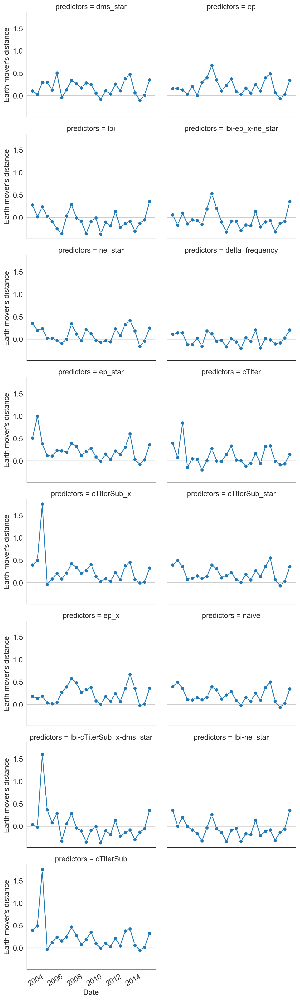

In [132]:
g = facet_time_plot(
    errors_by_time_df,
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    col_wrap=2,
    markersize=7
)

In [133]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

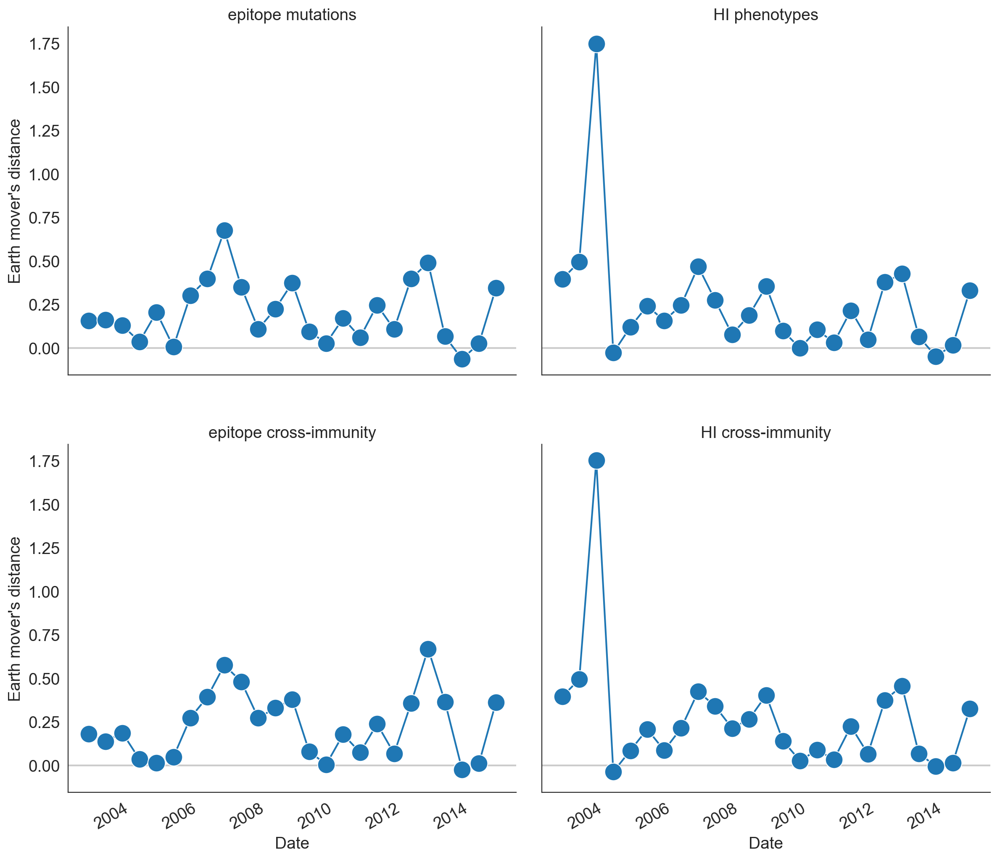

In [134]:
antigenic_predictors = predictor_type_order[1:5]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(antigenic_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in antigenic_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [135]:
predictor_type_order

['naive',
 'ep',
 'cTiterSub',
 'ep_x',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'lbi',
 'delta_frequency']

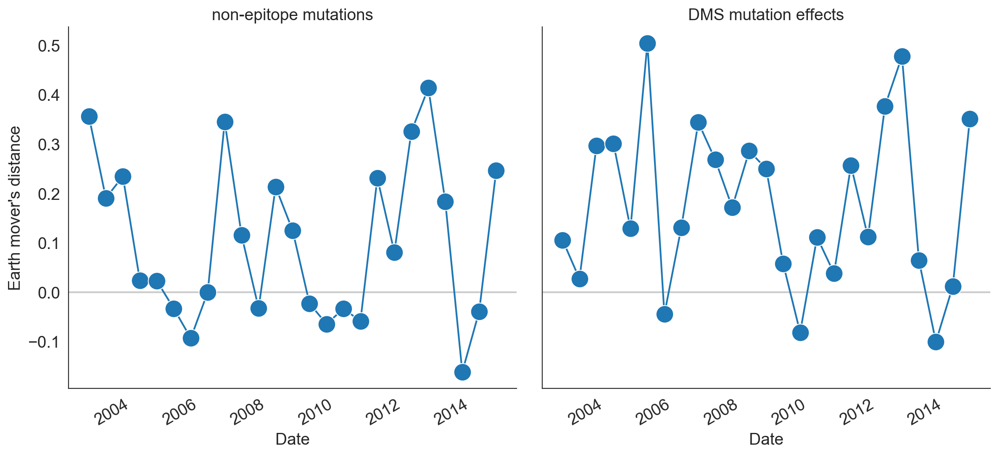

In [136]:
functional_predictors = predictor_type_order[5:7]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(functional_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in functional_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)


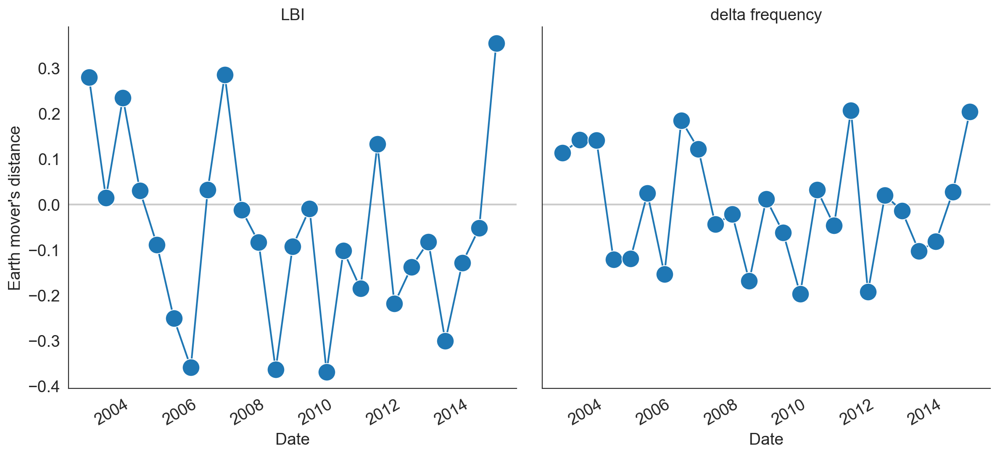

In [137]:
growth_predictors = predictor_type_order[7:]
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"].isin(growth_predictors)],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_wrap=2,
    height=6,
    aspect=1.,
    col_order=[predictor_name_by_id[predictor] for predictor in growth_predictors]
)
g.set_titles("{col_name}")
g.fig.subplots_adjust(hspace=0.2)

In [138]:
errors_by_time_df["predictors"].unique()

array(['dms_star', 'ep', 'lbi', 'lbi-ep_x-ne_star', 'ne_star',
       'delta_frequency', 'ep_star', 'cTiter', 'cTiterSub_x',
       'cTiterSub_star', 'ep_x', 'naive', 'lbi-cTiterSub_x-dms_star',
       'lbi-ne_star', 'cTiterSub'], dtype=object)

In [139]:
errors_by_time_df[errors_by_time_df["predictors"] == "naive"]

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
275,naive,0.395841,110,2002-10-01,null
276,naive,0.494600,117,2003-04-01,null
277,naive,0.360408,139,2003-10-01,null
278,naive,0.107849,157,2004-04-01,null
279,naive,0.097994,152,2004-10-01,null
280,naive,0.152901,165,2005-04-01,null
281,naive,0.102579,188,2005-10-01,null
282,naive,0.165764,193,2006-04-01,null
283,naive,0.394389,163,2006-10-01,null
284,naive,0.326024,166,2007-04-01,null


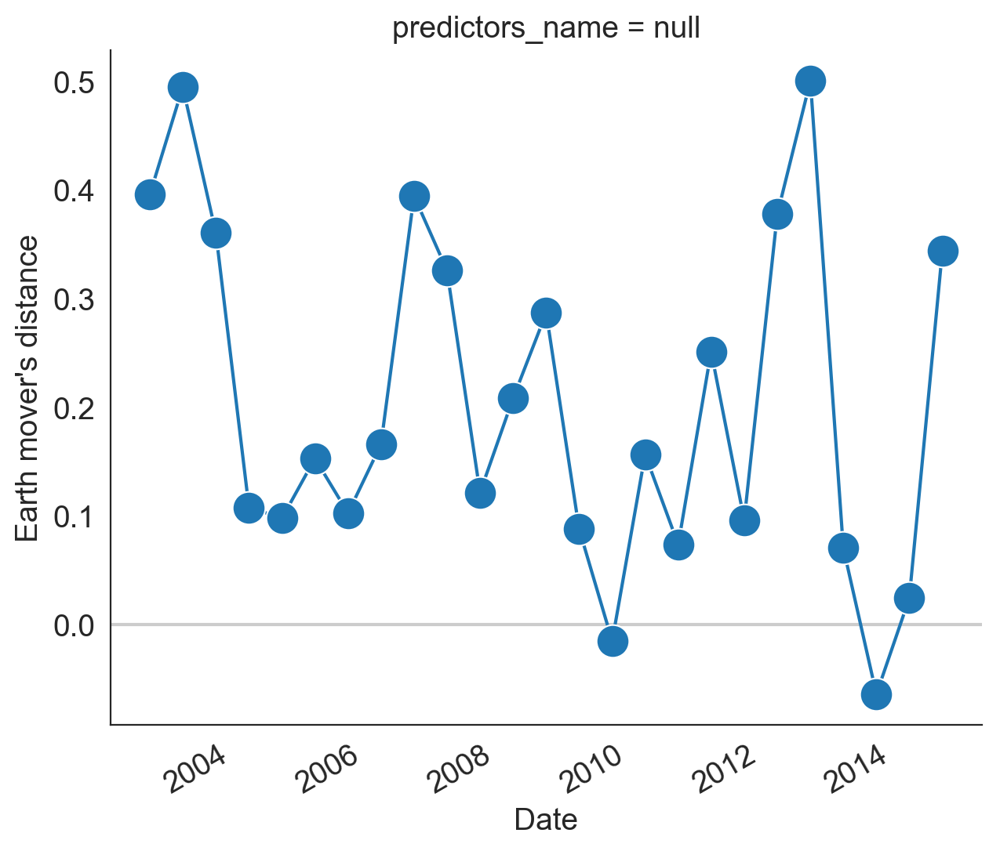

In [140]:
g = facet_time_plot(
    errors_by_time_df[errors_by_time_df["predictors"] == "naive"],
    "validation_error",
    "Earth mover's distance",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    height=6,
    aspect=1
)
#g.set_titles("{col_name}")
#g.fig.subplots_adjust(hspace=0.2)

In [141]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name
0,dms_star,0.105536,110,2002-10-01,DMS mutation effects
1,dms_star,0.026840,117,2003-04-01,DMS mutation effects
2,dms_star,0.296473,139,2003-10-01,DMS mutation effects
3,dms_star,0.301177,157,2004-04-01,DMS mutation effects
4,dms_star,0.128665,152,2004-10-01,DMS mutation effects


### Adjusted earth mover's distance (relative to naive model)

In [142]:
naive_error = errors_by_time_df[errors_by_time_df["predictors"] == "naive"]["validation_error"].values
for predictor in errors_by_time_df["predictors"].drop_duplicates().values:
    #adjusted_error = ((errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error) / naive_error) * 100
    adjusted_error = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "validation_error"] - naive_error
    errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"] = adjusted_error

In [143]:
naive_error

array([ 0.39584144,  0.4946002 ,  0.36040827,  0.1078489 ,  0.0979936 ,
        0.15290133,  0.10257923,  0.1657636 ,  0.39438921,  0.32602433,
        0.12152174,  0.20839665,  0.28687613,  0.08791818, -0.01511965,
        0.15664382,  0.07370375,  0.25130115,  0.09625483,  0.37761432,
        0.500461  ,  0.07047686, -0.06400361,  0.02432113,  0.34426015])

In [144]:
median_adjusted_error = errors_by_time_df.groupby("predictors")["adjusted_error"].median().reset_index().sort_values(by="adjusted_error")
median_adjusted_error_order = median_adjusted_error["predictors"].values

In [145]:
errors_by_time_df["adjusted_error"].min()

-0.6642541205736711

In [146]:
errors_by_time_df["adjusted_error"].max()

1.393356644231163

In [147]:
median_adjusted_error_order

array(['lbi-ne_star', 'lbi-cTiterSub_x-dms_star', 'lbi',
       'lbi-ep_x-ne_star', 'delta_frequency', 'cTiter', 'ne_star',
       'dms_star', 'cTiterSub', 'ep', 'cTiterSub_x', 'cTiterSub_star',
       'naive', 'ep_star', 'ep_x'], dtype=object)

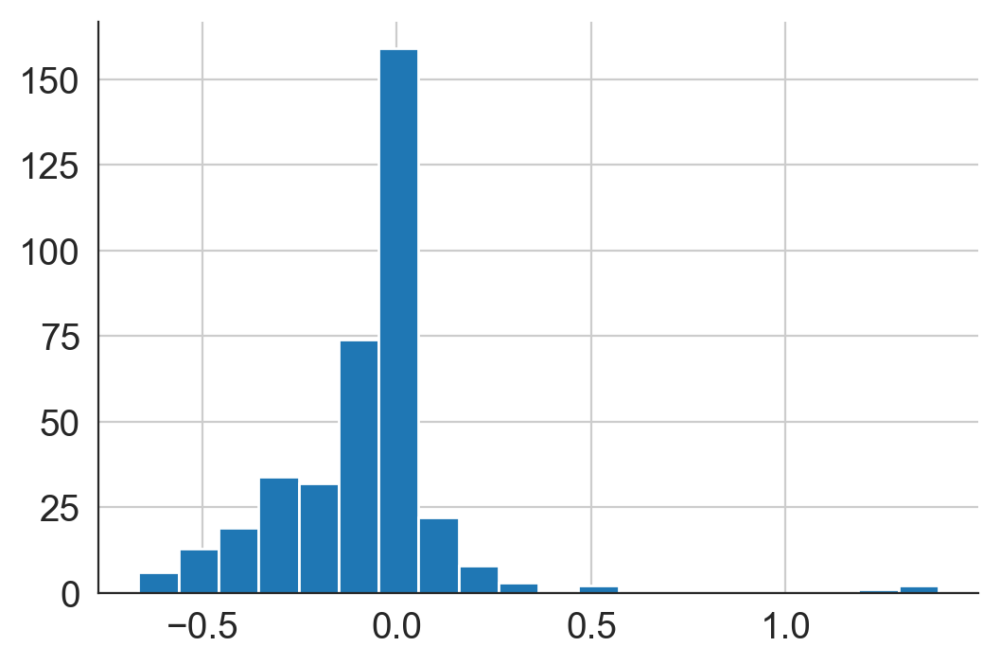

In [148]:
errors_by_time_df["adjusted_error"].hist(bins=20)

Text(0,0.5,'Model')

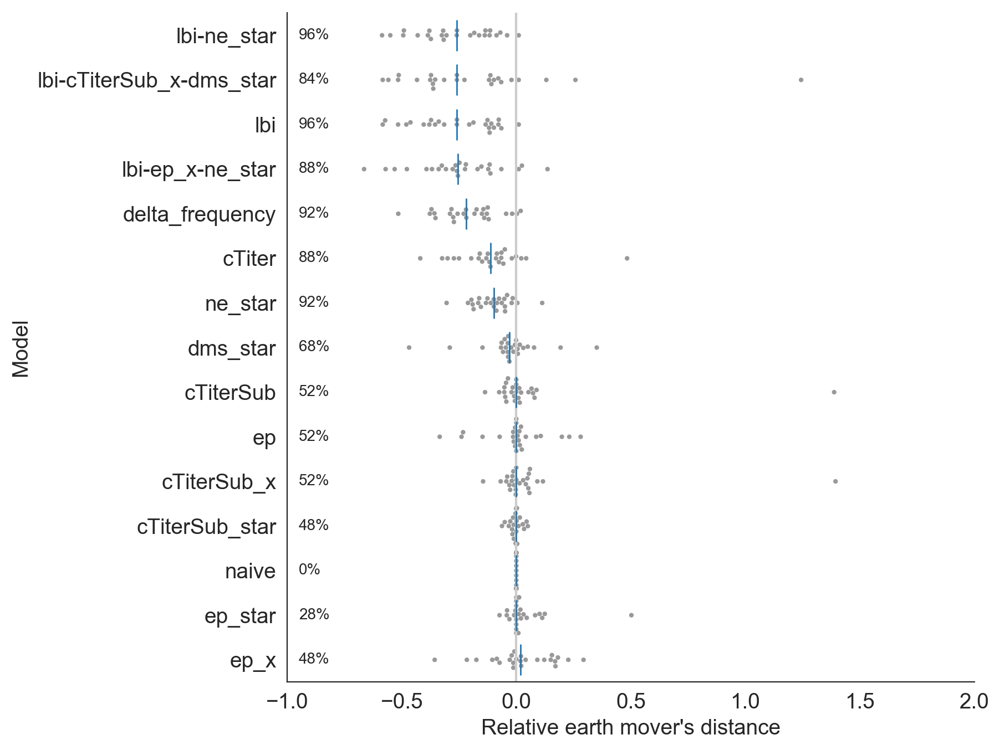

In [149]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-1, 2)

ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10,
    size=3
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)


#ax.text(0.5, 0, "test")
for i, predictor in enumerate(median_adjusted_error_order):
    predictor_errors = errors_by_time_df.loc[errors_by_time_df["predictors"] == predictor, "adjusted_error"]
    
    ax.text(
        -0.95,
        i,
        "%i%%" % (((predictor_errors < 0).sum() / float(predictor_errors.shape[0])) * 100),
        horizontalalignment='left',
        verticalalignment='center',
        fontsize=10
    )

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Relative earth mover's distance")
ax.set_ylabel("Model")

In [150]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error
0,dms_star,0.105536,110,2002-10-01,DMS mutation effects,-0.290305
1,dms_star,0.026840,117,2003-04-01,DMS mutation effects,-0.467761
2,dms_star,0.296473,139,2003-10-01,DMS mutation effects,-0.063936
3,dms_star,0.301177,157,2004-04-01,DMS mutation effects,0.193328
4,dms_star,0.128665,152,2004-10-01,DMS mutation effects,0.030671


In [151]:
coefficients_by_time_df.head()

,coefficient,predictor,predictors,validation_timepoint
0,1.103679,dms_star,dms_star,2002-10-01
1,1.430357,dms_star,dms_star,2003-04-01
2,2.337460,dms_star,dms_star,2003-10-01
3,2.387480,dms_star,dms_star,2004-04-01
4,2.283802,dms_star,dms_star,2004-10-01


In [152]:
errors_and_coefficients_by_time = coefficients_by_time_df.merge(
    errors_by_time_df,
    on=["predictors", "validation_timepoint"]
)

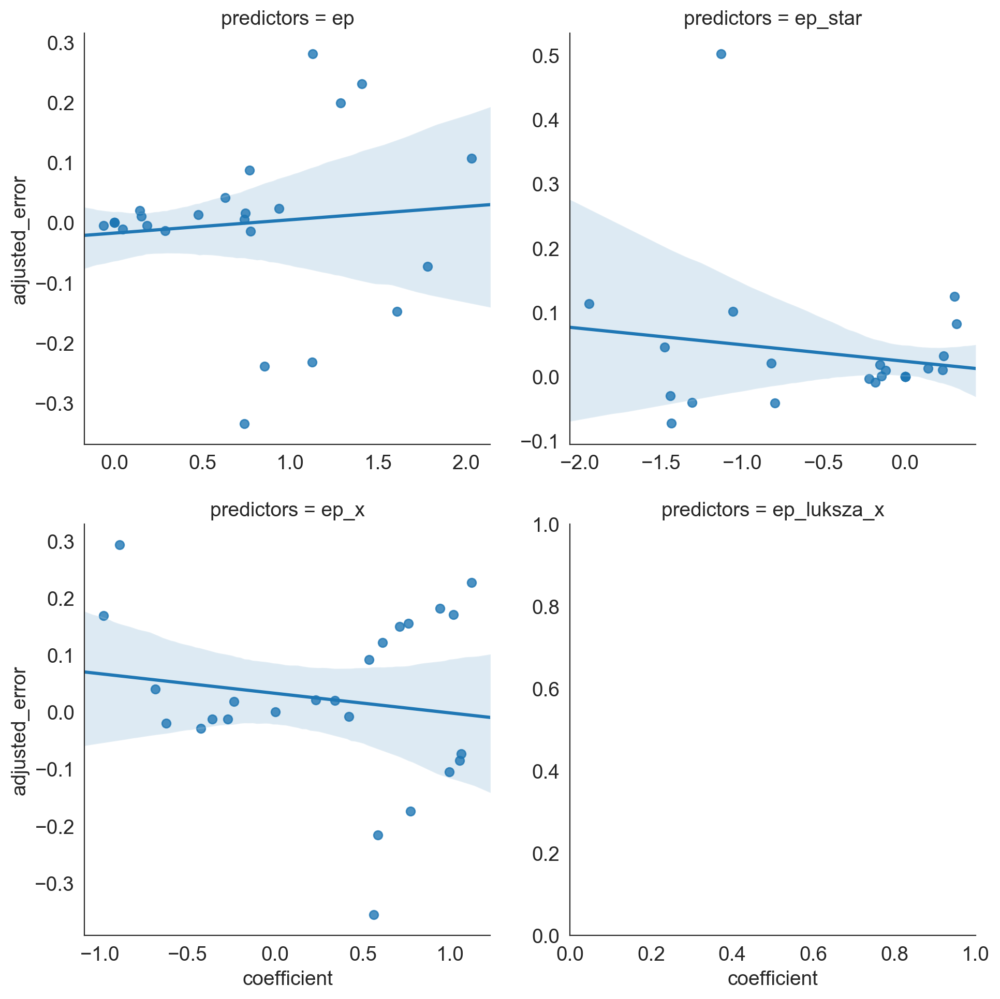

In [153]:
sns.lmplot(
    "coefficient",
    "adjusted_error",
    errors_and_coefficients_by_time,
    col="predictors",
    col_wrap=2,
    sharex=False,
    sharey=False,
    col_order=["ep", "ep_star", "ep_x", "ep_luksza_x"]
)

In [154]:
predictor_errors.shape[0]

25

Text(0,0.5,'Model')

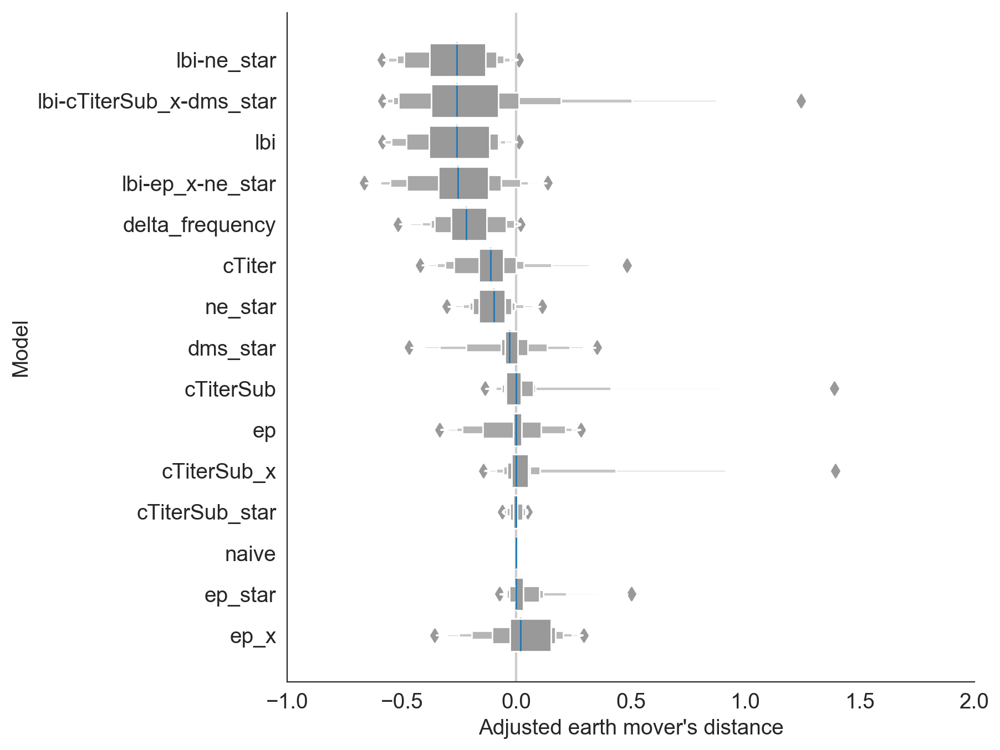

In [155]:
fig, ax = plt.subplots(1, 1, figsize=(8, 8))

ax.set_xlim(-1, 2)

"""
ax = sns.swarmplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)
"""

ax = sns.boxenplot(
    x="adjusted_error",
    y="predictors",
    data=errors_by_time_df,
    ax=ax,
    order=median_adjusted_error_order,
    color="#999999",
    zorder=-10
)

ax.plot(
    median_adjusted_error["adjusted_error"],
    median_adjusted_error_order,
    marker="|",
    markersize=20,
    linestyle=""
)

ax.axvline(x=0, color="#cccccc", zorder=-10)

ax.set_xlabel("Adjusted earth mover's distance")
ax.set_ylabel("Model")

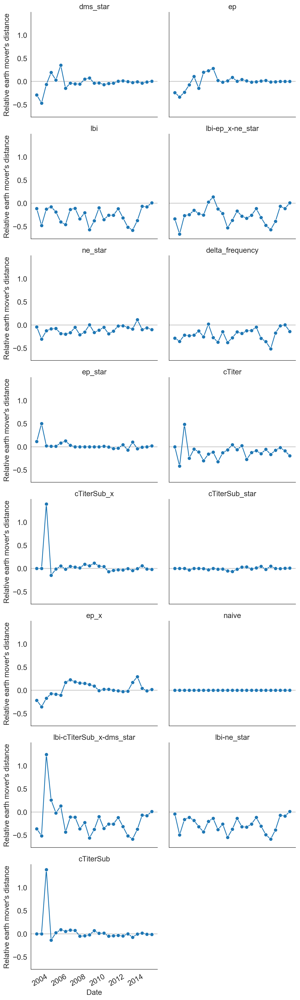

In [156]:
g = facet_time_plot(errors_by_time_df, "adjusted_error", "Relative earth mover's distance", timepoint_column="validation_timepoint",
                    col_wrap=2, markersize=7)
g.set_titles("{col_name}")

#for ax in g.axes.flatten():
#    ax.set_ylim(-5, 5)

In [157]:
individual_predictor_names_order

['ep',
 'ep_star',
 'ep_x',
 'cTiterSub',
 'cTiterSub_star',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'delta_frequency',
 'lbi']

In [158]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error
0,dms_star,0.105536,110,2002-10-01,DMS mutation effects,-0.290305
1,dms_star,0.026840,117,2003-04-01,DMS mutation effects,-0.467761
2,dms_star,0.296473,139,2003-10-01,DMS mutation effects,-0.063936
3,dms_star,0.301177,157,2004-04-01,DMS mutation effects,0.193328
4,dms_star,0.128665,152,2004-10-01,DMS mutation effects,0.030671


In [159]:
errors_by_time_df["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(errors_by_time_df["validation_timepoint"]))

In [160]:
def facet_time_plot_with_labels(data, value, value_label, timepoint_column="timepoint", predictors_column="predictors", hue=None,
                    height=4, aspect=1, col_order=None, col_wrap=4, markersize=15, grid_kwargs=None):
    if grid_kwargs is None:
        grid_kwargs = {}
        
    g = sns.FacetGrid(data, col=predictors_column, col_order=col_order, col_wrap=col_wrap, hue=hue,
                      height=height, aspect=aspect, **grid_kwargs)
    g.map_dataframe(sns.lineplot, x=timepoint_column, y=value, estimator="mean", ci="sd", markers=True, dashes=False,
                   style=predictors_column, markersize=markersize)
    g.set_axis_labels("Date", value_label)

    for ax in g.axes.flatten():
        ax.axhline(y=0, color="#cccccc", zorder=-10)

        ax.xaxis.set_major_locator(mdates.YearLocator())
        #ax.xaxis.set_minor_locator(mdates.MonthLocator())
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        #ax.fmt_xdata = mdates.DateFormatter('%Y')
        
        #start, end = [int(value) for value in ax.get_xlim()]
        #end = end + 1
        #stepsize = 2.0
        #ax.xaxis.set_ticks(np.arange(start, end, stepsize))

        #labels = ax.get_xticklabels()
        #output = plt.setp(labels, rotation=30)
        
    plt.gcf().autofmt_xdate(rotation=45)
    return g

In [161]:
mpl.__version__

'2.2.4'

In [162]:
best_models = [
    "ep_x",
    "ne_star",
    "lbi",
    "lbi-ep_x-ne_star",
    "cTiterSub_x",
    "dms_star",
    "delta_frequency",
    "lbi-cTiterSub_x-dms_star"
]

best_predictor_names = [
    "epitope mutations",
    "non-epitope mutations",
    "LBI",
    "LBI and mutations",
    "HI phenotypes",
    "DMS phenotypes",
    "delta frequency",
    "LBI, HI, and DMS"
]

In [163]:
final_models_by_time_df = errors_by_time_df[errors_by_time_df["predictors"].isin(best_models)].copy()

In [164]:
final_models_by_time_df["predictors_name"] = final_models_by_time_df["predictors"].map(dict(zip(best_models, best_predictor_names)))

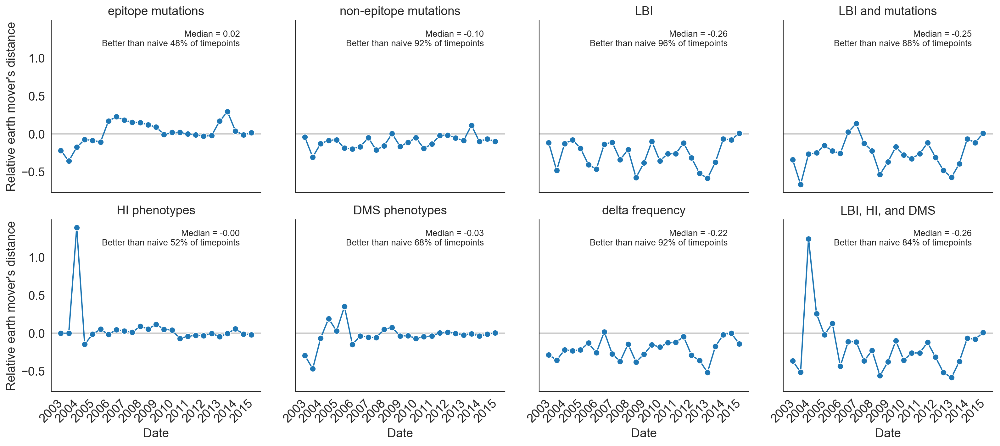

In [165]:
g = facet_time_plot_with_labels(
    final_models_by_time_df,
    "adjusted_error",
    "Relative earth mover's distance",
    predictors_column="predictors_name",
    timepoint_column="validation_timepoint_float",
    col_wrap=4,
    markersize=7,
    col_order=best_predictor_names
)
g.set_titles("{col_name}")

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    #ax.set_ylim(-5, 5)
    
    proportion_better_than_naive = int(round(sum(facet_df["adjusted_error"] < 0) / float(facet_df.shape[0]) * 100))
    ax.text(
        0.9,
        0.85,
        "Median = %.2f\nBetter than naive %i%% of timepoints" % (facet_df["adjusted_error"].median(), proportion_better_than_naive),
        transform=ax.transAxes,
        fontsize=10,
        horizontalalignment='right'
    )

## Summarize model coefficients

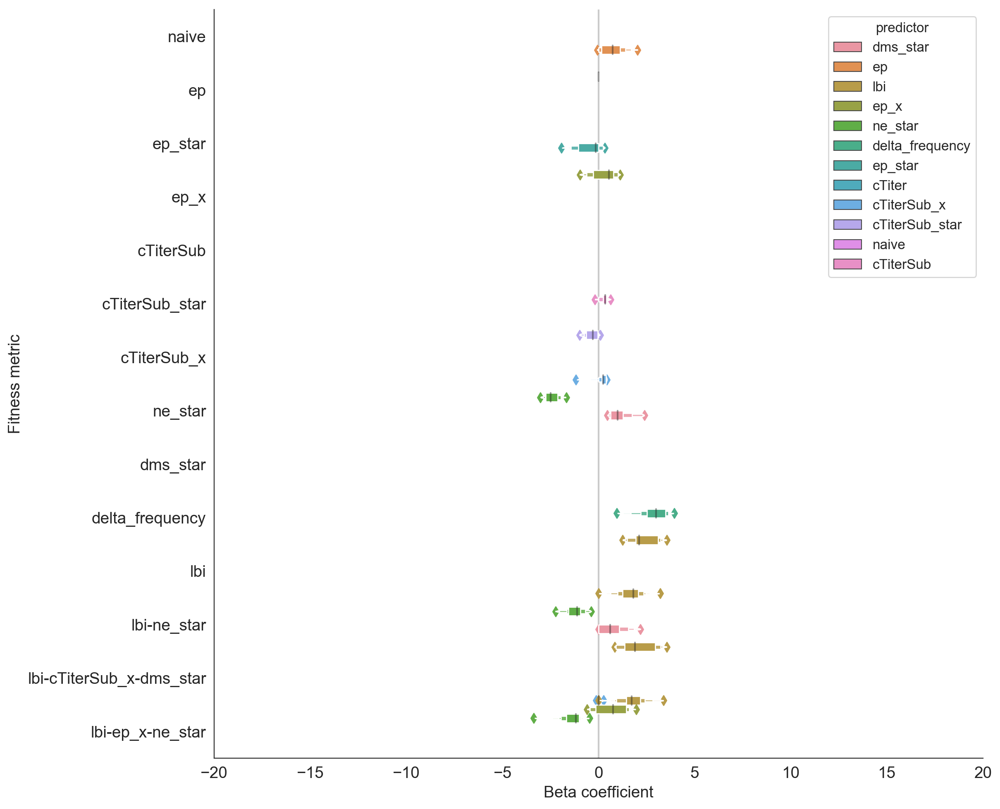

In [166]:
fig, ax = plt.subplots(1, 1, figsize=(12, 12))

ax.set_xlim(-20, 20)
sns.boxenplot(
    y="predictors",
    x="coefficient",
    hue="predictor",
    data=coefficients_by_time_df,
    width=2.0,
    ax=ax,
    order=predictor_names_order
)

ax.axvline(0, color="#999999", alpha=0.5, zorder=-10)
ax.set_xlabel("Beta coefficient")
ax.set_ylabel("Fitness metric")

sns.despine()

In [167]:
overall_coefficients_df

,mean,predictor,predictors,std
0,1.099038,dms_star,dms_star,0.567915
1,0.710168,ep,ep,0.586998
2,2.340705,lbi,lbi,0.676576
3,1.748102,lbi,lbi-ep_x-ne_star,0.732501
4,0.641398,ep_x,lbi-ep_x-ne_star,0.832312
5,-1.417887,ne_star,lbi-ep_x-ne_star,0.577870
6,-2.427157,ne_star,ne_star,0.372045
7,2.908487,delta_frequency,delta_frequency,0.724441
8,-0.440672,ep_star,ep_star,0.667508
9,1.157798,cTiter,cTiter,0.605760


In [168]:
coefficients_by_time_df.head()

,coefficient,predictor,predictors,validation_timepoint
0,1.103679,dms_star,dms_star,2002-10-01
1,1.430357,dms_star,dms_star,2003-04-01
2,2.337460,dms_star,dms_star,2003-10-01
3,2.387480,dms_star,dms_star,2004-04-01
4,2.283802,dms_star,dms_star,2004-10-01


In [169]:
final_coefficients_by_time = coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(best_models)].copy()

In [170]:
final_coefficients_by_time["predictors_name"] = final_coefficients_by_time["predictors"].map(dict(zip(best_models, best_predictor_names)))

In [171]:
final_coefficients_by_time["validation_timepoint_float"] = mdates.date2num(pd.to_datetime(final_coefficients_by_time["validation_timepoint"]))

In [172]:
final_coefficients_by_time.head()

,coefficient,predictor,predictors,validation_timepoint,predictors_name,validation_timepoint_float
0,1.103679,dms_star,dms_star,2002-10-01,DMS phenotypes,731124.0
1,1.430357,dms_star,dms_star,2003-04-01,DMS phenotypes,731306.0
2,2.337460,dms_star,dms_star,2003-10-01,DMS phenotypes,731489.0
3,2.387480,dms_star,dms_star,2004-04-01,DMS phenotypes,731672.0
4,2.283802,dms_star,dms_star,2004-10-01,DMS phenotypes,731855.0


In [173]:
coefficients_by_time_df["predictors_name"] = coefficients_by_time_df["predictors"].map(predictor_name_by_id)

In [174]:
coefficients_by_time_df.loc[pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors_name"] = coefficients_by_time_df.loc[
    pd.isnull(coefficients_by_time_df["predictors_name"]), "predictors"
]

In [175]:
coefficients_by_time_df["predictors_name"].unique().shape

(15,)

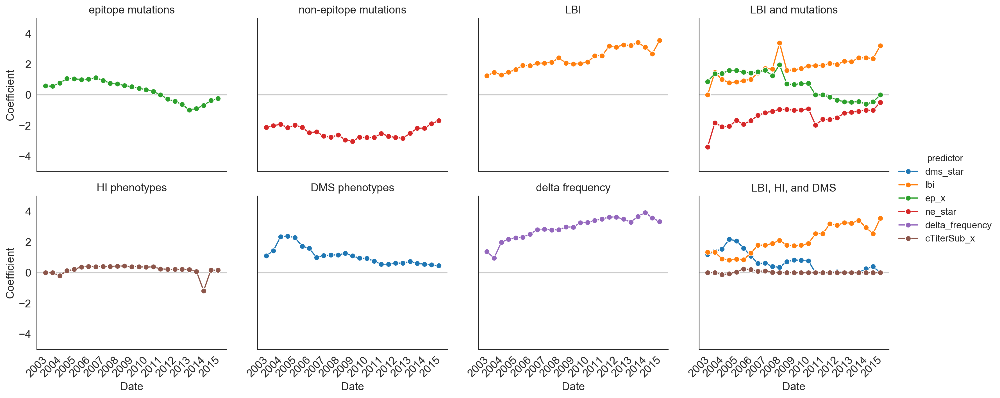

In [176]:
g = facet_time_plot_with_labels(
    final_coefficients_by_time,
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint_float",
    predictors_column="predictors_name",
    hue="predictor",
    col_order=best_predictor_names,
    col_wrap=4,
    markersize=7
)
g.set_titles("{col_name}")
g.add_legend()

for ((i, j, k), facet_df), ax in zip(g.facet_data(), g.axes.flat):
    ax.set_ylim(-5, 5)

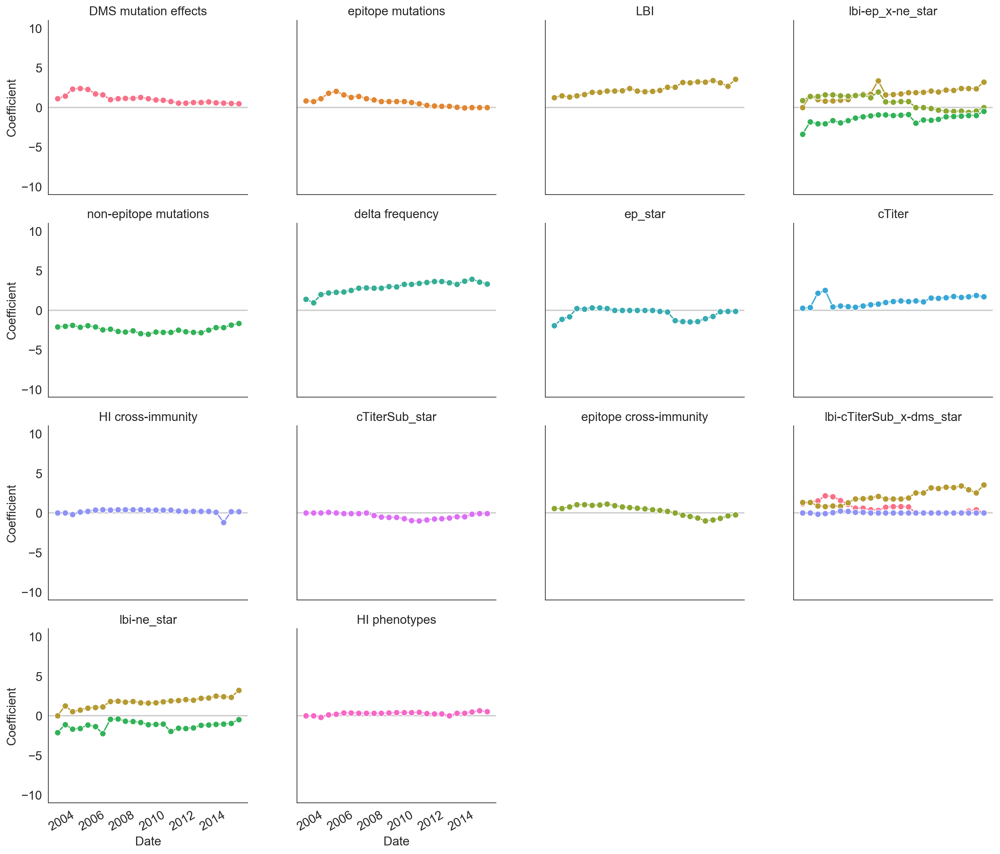

In [177]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

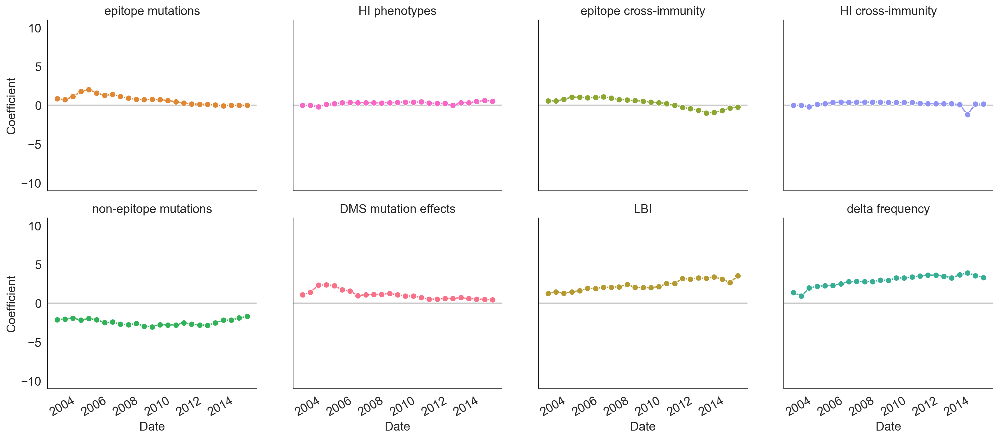

In [178]:
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"] != "naive"],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    predictors_column="predictors_name",
    col_order=[predictor_name_by_id[predictor] for predictor in predictor_type_order[1:]],
    hue="predictor",
    markersize=7
)
g.set_titles("{col_name}")

for ax in g.axes.flatten():
    ax.set_ylim(-11, 11)

In [179]:
composite_predictors_order

['lbi',
 'delta_frequency',
 'cTiterSub_x',
 'lbi-delta_frequency',
 'lbi-cTiterSub_x',
 'lbi-dms_star-cTiterSub_x',
 'lbi-ep_x-ne_star']

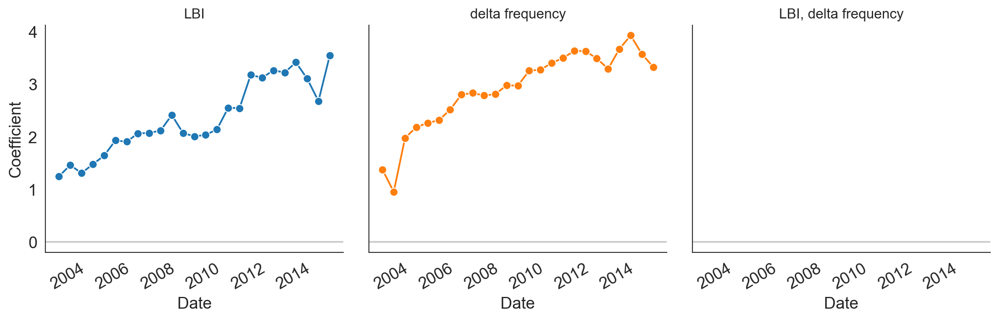

In [180]:
lbi_dfreq_order = ["lbi", "delta_frequency", "lbi-delta_frequency"]
lbi_dfreq_names = ["LBI", "delta frequency", "LBI, delta frequency"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

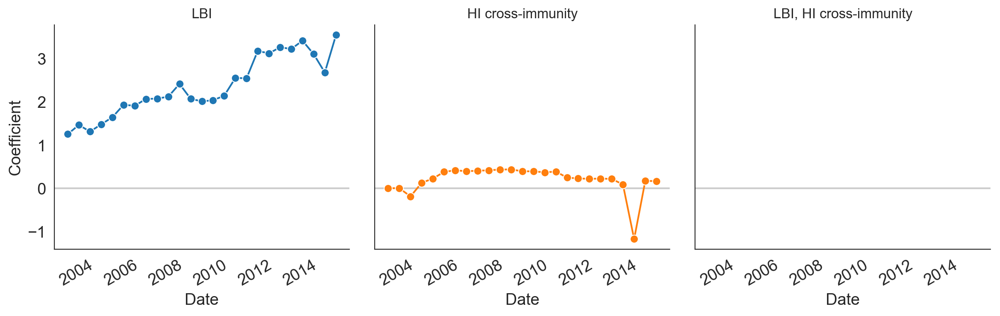

In [181]:
lbi_dfreq_order = ["lbi", "cTiterSub_x", "lbi-cTiterSub_x"]
lbi_dfreq_names = ["LBI", "HI cross-immunity", "LBI, HI cross-immunity"]
g = facet_time_plot(
    coefficients_by_time_df[coefficients_by_time_df["predictors"].isin(lbi_dfreq_order)],
    "coefficient",
    "Coefficient",
    timepoint_column="validation_timepoint",
    hue="predictor",
    col_order=lbi_dfreq_order,
    markersize=7
)

#g.set_titles("{col_name}")

for ci, ax in enumerate(g.axes.flatten()):
    ax.set_title(lbi_dfreq_names[ci], fontsize=12)
    #ax.set_ylim(-2., 2.)

## Figure 3: Summary of models for natural populations

In [182]:
colors = ['#d73027','#fc8d59','#fee090','#e0f3f8','#91bfdb','#4575b4']

In [183]:
colors.reverse()

In [184]:
colors

['#4575b4', '#91bfdb', '#e0f3f8', '#fee090', '#fc8d59', '#d73027']

In [185]:
dict(zip(individual_predictor_names_order, colors))

{'ep': '#4575b4',
 'ep_star': '#91bfdb',
 'ep_x': '#e0f3f8',
 'cTiterSub': '#fee090',
 'cTiterSub_star': '#fc8d59',
 'cTiterSub_x': '#d73027'}

In [186]:
nrows = len(individual_predictor_names_order)
ncols = 2
color_by_predictor = {
    'ep': '#4575b4',
    'ep_star': '#4575b4',
    'ep_x': '#4575b4',
    'cTiter': '#91bfdb',
    'cTiterSub': '#91bfdb',
    'cTiterSub_star': '#91bfdb',
    'cTiterSub_x': '#91bfdb',
    'ne_star': '#999999',
    'dms_star': '#fee090',
    'lbi': '#fc8d59',
    'delta_frequency': '#d73027'
}

name_by_predictor = {
    "ep": "epitope mutations",
    "ep_star": "epitope ancestor",
    "ep_x": "cross-immunity",
    "cTiter": "linear HI tree phenotypes",
    "cTiterSub": "linear HI mutation phenotypes",
    "cTiterSub_star": "ancestral HI mutation phenotypes",
    "cTiterSub_x": "HI phenotypes",
    "ne_star": "non-epitope mutations",
    "dms_star": "DMS phenotypes",
    "lbi": "LBI",
    "delta_frequency": "delta frequency"
}

In [187]:
errors_by_time_df.head()

,predictors,validation_error,validation_n,validation_timepoint,predictors_name,adjusted_error,validation_timepoint_float
0,dms_star,0.105536,110,2002-10-01,DMS mutation effects,-0.290305,731124.0
1,dms_star,0.026840,117,2003-04-01,DMS mutation effects,-0.467761,731306.0
2,dms_star,0.296473,139,2003-10-01,DMS mutation effects,-0.063936,731489.0
3,dms_star,0.301177,157,2004-04-01,DMS mutation effects,0.193328,731672.0
4,dms_star,0.128665,152,2004-10-01,DMS mutation effects,0.030671,731855.0


In [188]:
min_error = errors_by_time_df["adjusted_error"].min()
max_error = errors_by_time_df["adjusted_error"].max()

min_normal_error = errors_by_time_df["validation_error"].min()
max_normal_error = errors_by_time_df["validation_error"].max()

min_coefficient = coefficients_by_time_df["coefficient"].min()
max_coefficient = coefficients_by_time_df["coefficient"].max()

min_date = errors_by_time_df["validation_timepoint"].min() - pd.DateOffset(months=6)
max_date = errors_by_time_df["validation_timepoint"].max() + pd.DateOffset(months=6)

In [189]:
individual_predictor_names_order

['ep',
 'ep_star',
 'ep_x',
 'cTiterSub',
 'cTiterSub_star',
 'cTiterSub_x',
 'ne_star',
 'dms_star',
 'delta_frequency',
 'lbi']

In [190]:
individual_predictor_names_order = [
    'ep_x',
    "cTiter",
    'ne_star',
    'dms_star',
    'delta_frequency',
    'lbi'
]

In [200]:
nrows = len(individual_predictor_names_order)

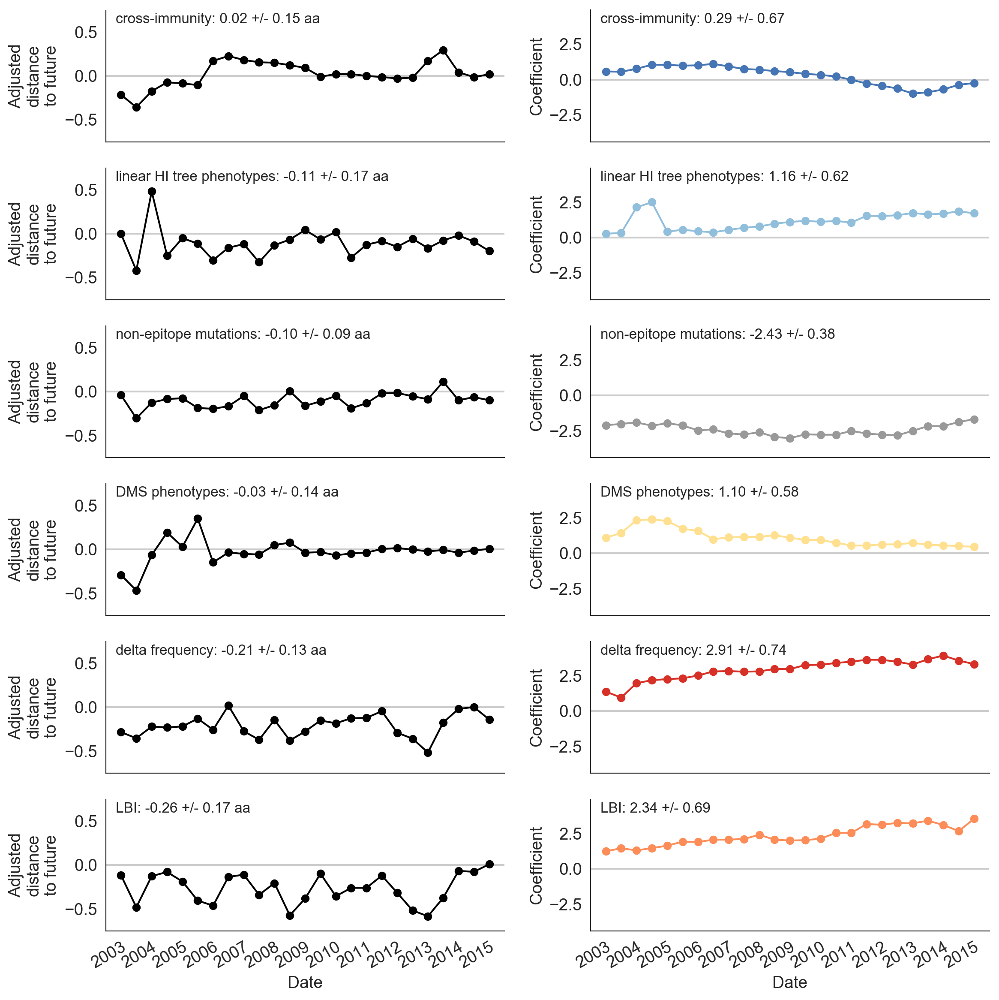

In [201]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows,
    ncols=ncols,
    hspace=0.05,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

for i, predictor in enumerate(individual_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Adjusted\ndistance\nto future")
    distance_ax.set_ylim(-0.75, 0.75)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f aa" % (name_by_predictor[predictor], error_df["adjusted_error"].mean(), error_df["adjusted_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["adjusted_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 1)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], coefficient_df["coefficient"].mean(), coefficient_df["coefficient"].std()),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    coefficient_ax.plot(
        coefficient_df["validation_timepoint"],
        coefficient_df["coefficient"],
        "o-",
        color=color_by_predictor[predictor]
    )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/model-accuracy-and-coefficients-for-natural-populations.png")

# show x-axis tick lines

In [202]:
nrows

6

In [203]:
individual_predictor_names_order

['ep_x', 'cTiter', 'ne_star', 'dms_star', 'delta_frequency', 'lbi']

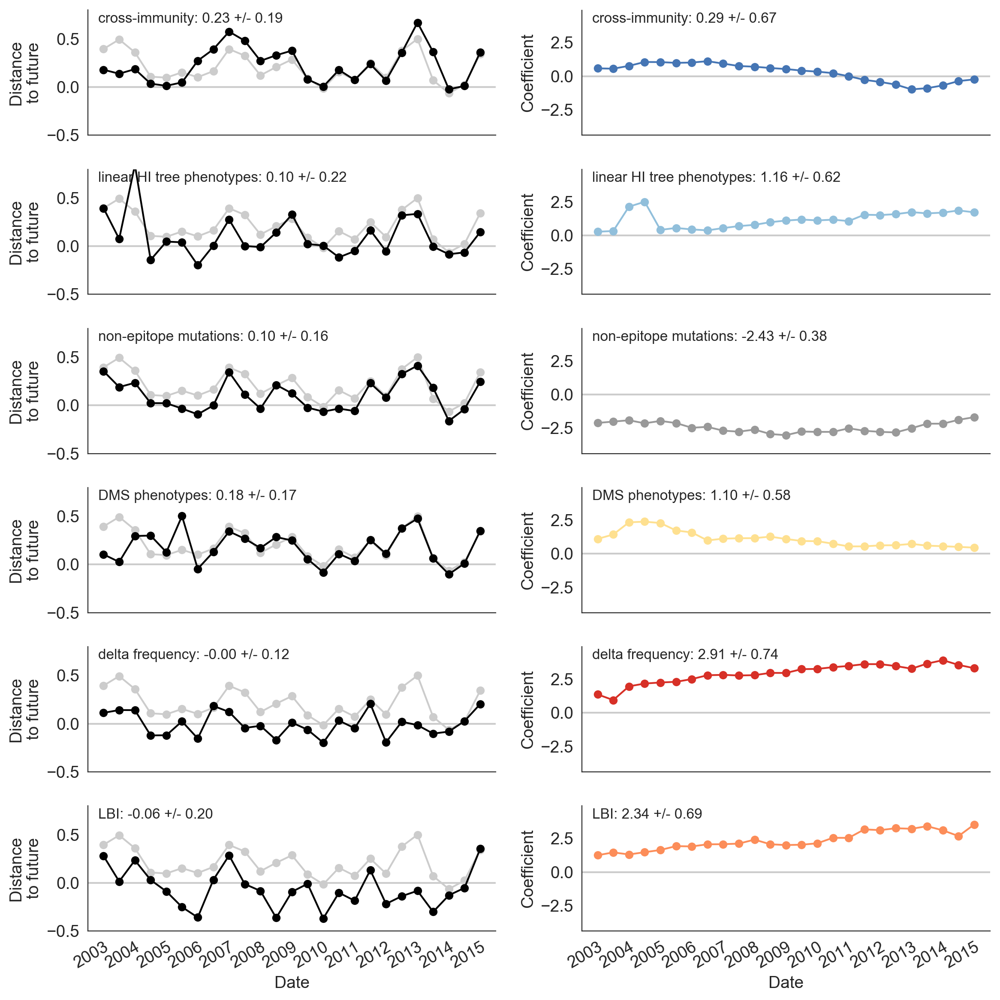

In [204]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

naive_error_df = errors_by_time_df[errors_by_time_df["predictors"] == "naive"].copy()

for i, predictor in enumerate(individual_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Distance\nto future")
    distance_ax.set_ylim(-0.5, 0.8)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], error_df["validation_error"].mean(), error_df["validation_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(naive_error_df["validation_timepoint"]).astype(np.datetime64),
        naive_error_df["validation_error"],
        "o-",
        color="#cccccc",
        zorder=-10
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["validation_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 1)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (name_by_predictor[predictor], coefficient_df["coefficient"].mean(), coefficient_df["coefficient"].std()),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    coefficient_ax.plot(
        coefficient_df["validation_timepoint"],
        coefficient_df["coefficient"],
        "o-",
        color=color_by_predictor[predictor]
    )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/unadjusted-model-accuracy-and-coefficients-for-natural-populations.png")

# show x-axis tick lines

In [193]:
composite_predictor_names_order = ["lbi", "ep_x", "ne_star"] + [
    predictor
    for predictor in predictor_names_order
    if "-" in predictor
]

In [194]:
composite_predictor_names_order

['lbi',
 'ep_x',
 'ne_star',
 'lbi-ne_star',
 'lbi-cTiterSub_x-dms_star',
 'lbi-ep_x-ne_star']

In [195]:
nrows_composite = len(composite_predictor_names_order)

In [196]:
errors_by_time_df["predictors"].unique()

array(['dms_star', 'ep', 'lbi', 'lbi-ep_x-ne_star', 'ne_star',
       'delta_frequency', 'ep_star', 'cTiter', 'cTiterSub_x',
       'cTiterSub_star', 'ep_x', 'naive', 'lbi-cTiterSub_x-dms_star',
       'lbi-ne_star', 'cTiterSub'], dtype=object)

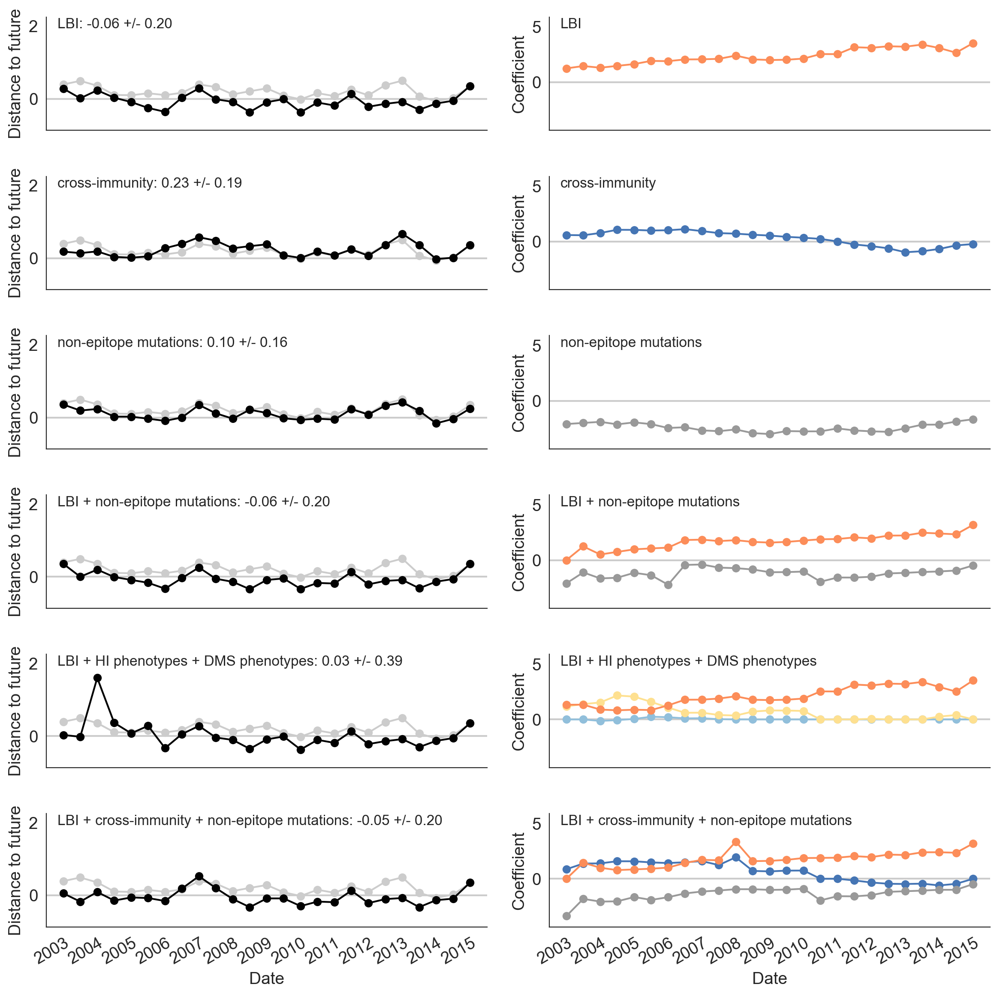

In [197]:
fig, axes = plt.subplots(figsize=(12, 12), facecolor='w')
gs = gridspec.GridSpec(
    nrows=nrows_composite,
    ncols=ncols,
    hspace=0.1,
    wspace=0.2
)

years = mdates.YearLocator()
years_fmt = mdates.DateFormatter('%Y')
months = mdates.MonthLocator()

naive_error_df = errors_by_time_df[errors_by_time_df["predictors"] == "naive"].copy()

for i, predictor in enumerate(composite_predictor_names_order):
    error_df = errors_by_time_df[errors_by_time_df["predictors"] == predictor].copy()
    coefficient_df = coefficients_by_time_df[coefficients_by_time_df["predictors"] == predictor].copy()
    composite_predictors = predictor.split("-")
    composite_predictors_name = " + ".join([name_by_predictor[predictor_name] for predictor_name in composite_predictors])

    distance_ax = plt.subplot(gs[i, 0])    
    distance_ax.set_xlabel("Date")
    distance_ax.set_ylabel("Distance to future")
    distance_ax.set_ylim(min_normal_error - 0.5, max_normal_error + 0.5)
    distance_ax.text(
        0.025,
        0.9,
        "%s: %.2f +/- %.2f" % (composite_predictors_name, error_df["validation_error"].mean(), error_df["validation_error"].std()),
        fontdict={"fontsize": 12},
        transform=distance_ax.transAxes
    )
    
    distance_ax.axhline(
        y=0.0,
        color="#cccccc"
    )
    
    distance_ax.plot(
        pd.to_datetime(naive_error_df["validation_timepoint"]).astype(np.datetime64),
        naive_error_df["validation_error"],
        "o-",
        color="#cccccc",
        zorder=-10
    )
    
    distance_ax.plot(
        pd.to_datetime(error_df["validation_timepoint"]).astype(np.datetime64),
        error_df["validation_error"],
        "o-",
        color="#000000"
    )
    
    distance_ax.set_xlim(min_date, max_date)
    distance_ax.xaxis.set_major_locator(years)
    distance_ax.xaxis.set_major_formatter(years_fmt)
    distance_ax.xaxis.set_minor_locator(months)
    distance_ax.format_xdata = mdates.DateFormatter('%Y-%m')
        
    coefficient_ax = plt.subplot(gs[i, 1])
    coefficient_ax.set_xlabel("Date")
    coefficient_ax.set_ylabel("Coefficient")
    coefficient_ax.set_ylim(min_coefficient - 1, max_coefficient + 2)

    coefficient_ax.text(
        0.025,
        0.9,
        "%s" % (composite_predictors_name,),
        fontdict={"fontsize": 12},
        transform=coefficient_ax.transAxes
    )
    
    coefficient_ax.axhline(
        y=0.0,
        color="#cccccc"
    )

    for predictor, predictor_coefficient_df in coefficient_df.groupby("predictor"):
        coefficient_ax.plot(
            predictor_coefficient_df["validation_timepoint"],
            predictor_coefficient_df["coefficient"],
            "o-",
            color=color_by_predictor[predictor]
        )
    
    coefficient_ax.set_xlim(min_date, max_date)
    coefficient_ax.xaxis.set_major_locator(years)
    coefficient_ax.xaxis.set_major_formatter(years_fmt)
    coefficient_ax.xaxis.set_minor_locator(months)
    coefficient_ax.format_xdata = mdates.DateFormatter('%Y-%m')
    
fig.autofmt_xdate()

gs.tight_layout(fig)
plt.savefig("../manuscript/figures/unadjusted-composite-model-accuracy-and-coefficients-for-natural-populations.png")

# show x-axis tick lines